# Data Mining - Computer Assignment #3

## Sina Negarandeh - SID: 810197640

## Prerequisites

Before anything we import libraries needed in this assignment.

In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

# For preprocessing and transforming date values
from datetime import datetime

# For applying PCA
from sklearn.decomposition import PCA

# For performing K-Means clustering
from sklearn.cluster import KMeans

# For performing DBSCAN clustering from vector array or distance matrix
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

In [2]:
pd.set_option('display.max_columns', None)

## Section 1 (K-Means)

We store the address of the dataset in a variable to maintain a clean code.

In [3]:
CAR_INSURANCE_DATA_PATH = 'data/car_insurance.csv'

In [4]:
car_insurance_df = pd.read_csv(CAR_INSURANCE_DATA_PATH)

We use the `head` method to get the first five rows of each dataframe to get a general idea of each column and its values.

In [5]:
car_insurance_df.head()

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,"$14,230",11,Minivan,yes,"$4,461",2,No,3,$0,18.0,0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,"$14,940",1,Minivan,yes,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,"$21,970",1,Van,yes,$0,0,No,2,$0,10.0,0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,"$4,010",4,z_SUV,no,"$38,690",2,No,3,$0,10.0,0,Highly Urban/ Urban
4,450221861,0,05JUN48,51.0,0,14.0,NaN,No,"$306,251",Yes,M,<High School,z_Blue Collar,32,Private,"$15,440",7,Minivan,yes,$0,0,No,0,$0,6.0,0,Highly Urban/ Urban


Here, we use `info` method to get a general information about the dataframe including the index dtype and columns, non-null values and memory usage.

In [6]:
car_insurance_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10302 entries, 0 to 10301
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          10302 non-null  int64  
 1   KIDSDRIV    10302 non-null  int64  
 2   BIRTH       10302 non-null  object 
 3   AGE         10295 non-null  float64
 4   HOMEKIDS    10302 non-null  int64  
 5   YOJ         9754 non-null   float64
 6   INCOME      9732 non-null   object 
 7   PARENT1     10302 non-null  object 
 8   HOME_VAL    9727 non-null   object 
 9   MSTATUS     10302 non-null  object 
 10  GENDER      10302 non-null  object 
 11  EDUCATION   10302 non-null  object 
 12  OCCUPATION  9637 non-null   object 
 13  TRAVTIME    10302 non-null  int64  
 14  CAR_USE     10302 non-null  object 
 15  BLUEBOOK    10302 non-null  object 
 16  TIF         10302 non-null  int64  
 17  CAR_TYPE    10302 non-null  object 
 18  RED_CAR     10302 non-null  object 
 19  OLDCLAIM    10302 non-nul

In [7]:
car_insurance_df.describe()

,ID,KIDSDRIV,AGE,HOMEKIDS,YOJ,TRAVTIME,TIF,CLM_FREQ,MVR_PTS,CAR_AGE,CLAIM_FLAG
count,1.030200e+04,10302.000000,10295.000000,10302.000000,9754.000000,10302.000000,10302.000000,10302.000000,10302.000000,9663.000000,10302.000000
mean,4.956631e+08,0.169288,44.837397,0.720443,10.474062,33.416424,5.329159,0.800718,1.710153,8.298148,0.266550
std,2.864675e+08,0.506512,8.606445,1.116323,4.108943,15.869687,4.110795,1.154079,2.159015,5.714450,0.442177
min,6.317500e+04,0.000000,16.000000,0.000000,0.000000,5.000000,1.000000,0.000000,0.000000,-3.000000,0.000000
25%,2.442869e+08,0.000000,39.000000,0.000000,9.000000,22.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,4.970043e+08,0.000000,45.000000,0.000000,11.000000,33.000000,4.000000,0.000000,1.000000,8.000000,0.000000
75%,7.394551e+08,0.000000,51.000000,1.000000,13.000000,44.000000,7.000000,2.000000,3.000000,12.000000,1.000000
max,9.999264e+08,4.000000,81.000000,5.000000,23.000000,142.000000,25.000000,5.000000,13.000000,28.000000,1.000000


We could also use `isna` method to check whether the dataframe contains any missing values or not. And then to take the corresponding action accordingly.

In [8]:
car_insurance_df.isna().sum()

ID              0
KIDSDRIV        0
BIRTH           0
AGE             7
HOMEKIDS        0
YOJ           548
INCOME        570
PARENT1         0
HOME_VAL      575
MSTATUS         0
GENDER          0
EDUCATION       0
OCCUPATION    665
TRAVTIME        0
CAR_USE         0
BLUEBOOK        0
TIF             0
CAR_TYPE        0
RED_CAR         0
OLDCLAIM        0
CLM_FREQ        0
REVOKED         0
MVR_PTS         0
CLM_AMT         0
CAR_AGE       639
CLAIM_FLAG      0
URBANICITY      0
dtype: int64

Since there are missing values in our dataset, first, we need to deal with them. Here, we choose to remove any rows that include any missing values (`nan values`).

In [9]:
car_insurance_df = car_insurance_df.dropna()

As we can see, the dataset does not include any missing values any more.

In [10]:
car_insurance_df.isna().sum()

ID            0
KIDSDRIV      0
BIRTH         0
AGE           0
HOMEKIDS      0
YOJ           0
INCOME        0
PARENT1       0
HOME_VAL      0
MSTATUS       0
GENDER        0
EDUCATION     0
OCCUPATION    0
TRAVTIME      0
CAR_USE       0
BLUEBOOK      0
TIF           0
CAR_TYPE      0
RED_CAR       0
OLDCLAIM      0
CLM_FREQ      0
REVOKED       0
MVR_PTS       0
CLM_AMT       0
CAR_AGE       0
CLAIM_FLAG    0
URBANICITY    0
dtype: int64

In [11]:
car_insurance_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7657 entries, 0 to 10301
Data columns (total 27 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   ID          7657 non-null   int64  
 1   KIDSDRIV    7657 non-null   int64  
 2   BIRTH       7657 non-null   object 
 3   AGE         7657 non-null   float64
 4   HOMEKIDS    7657 non-null   int64  
 5   YOJ         7657 non-null   float64
 6   INCOME      7657 non-null   object 
 7   PARENT1     7657 non-null   object 
 8   HOME_VAL    7657 non-null   object 
 9   MSTATUS     7657 non-null   object 
 10  GENDER      7657 non-null   object 
 11  EDUCATION   7657 non-null   object 
 12  OCCUPATION  7657 non-null   object 
 13  TRAVTIME    7657 non-null   int64  
 14  CAR_USE     7657 non-null   object 
 15  BLUEBOOK    7657 non-null   object 
 16  TIF         7657 non-null   int64  
 17  CAR_TYPE    7657 non-null   object 
 18  RED_CAR     7657 non-null   object 
 19  OLDCLAIM    7657 non-null 

Now, we need to preprocess the data before applying the clustering algorithm. There are two important notes that should be mentioned. First, Since k-means clustering algorithm assume that the data is scaled to a common range, such as \[0, 1\] and use the Euclidean distance to measure the similarity between data points. Therefore, normalizing all of the data can help to avoid biasing the clustering results by the different scales of the numerical and categorical data. Second, we need to handle categorical data, since k-means clustering algorithm can not handle these types of data inherently.

In [12]:
car_insurance_df.head()

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,16MAR39,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,"$14,230",11,Minivan,yes,"$4,461",2,No,3,$0,18.0,0,Highly Urban/ Urban
1,132761049,0,21JAN56,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,"$14,940",1,Minivan,yes,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
2,921317019,0,18NOV51,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,"$21,970",1,Van,yes,$0,0,No,2,$0,10.0,0,Highly Urban/ Urban
3,727598473,0,05MAR64,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,"$4,010",4,z_SUV,no,"$38,690",2,No,3,$0,10.0,0,Highly Urban/ Urban
6,871024631,0,05MAY65,34.0,1,12.0,"$125,301",Yes,$0,z_No,z_F,Bachelors,z_Blue Collar,46,Commercial,"$17,430",1,Sports Car,no,$0,0,No,0,"$2,946",7.0,1,Highly Urban/ Urban


In [13]:
car_insurance_df["BIRTH"] = car_insurance_df["BIRTH"].apply(lambda x: datetime.strptime(x, "%d%b%y"))

In [14]:
car_insurance_df["BIRTH"] = car_insurance_df["BIRTH"].apply(lambda x: x.replace(year=x.year - 100))

One way to use datetime object is to convert them into numerical variables and utlize them in the clustering algorithm. However, it is possible to only consider the year of the date, or extract even more features and treat all of them as numerical values.

In [15]:
# car_insurance_df["BIRTH"] = car_insurance_df["BIRTH"].apply(lambda x: int(x.year))
car_insurance_df["BIRTH"] = car_insurance_df["BIRTH"].apply(lambda x: x.timestamp())

In [16]:
car_insurance_df.head()

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,-971913600.0,60.0,0,11.0,"$67,349",No,$0,z_No,M,PhD,Professional,14,Private,"$14,230",11,Minivan,yes,"$4,461",2,No,3,$0,18.0,0,Highly Urban/ Urban
1,132761049,0,-440121600.0,43.0,0,11.0,"$91,449",No,"$257,252",z_No,M,z_High School,z_Blue Collar,22,Commercial,"$14,940",1,Minivan,yes,$0,0,No,0,$0,1.0,0,Highly Urban/ Urban
2,921317019,0,-571881600.0,48.0,0,11.0,"$52,881",No,$0,z_No,M,Bachelors,Manager,26,Private,"$21,970",1,Van,yes,$0,0,No,2,$0,10.0,0,Highly Urban/ Urban
3,727598473,0,-183859200.0,35.0,1,10.0,"$16,039",No,"$124,191",Yes,z_F,z_High School,Clerical,5,Private,"$4,010",4,z_SUV,no,"$38,690",2,No,3,$0,10.0,0,Highly Urban/ Urban
6,871024631,0,-147052800.0,34.0,1,12.0,"$125,301",Yes,$0,z_No,z_F,Bachelors,z_Blue Collar,46,Commercial,"$17,430",1,Sports Car,no,$0,0,No,0,"$2,946",7.0,1,Highly Urban/ Urban


Here we check again, which columns are numerical.

In [17]:
car_insurance_df.select_dtypes(include= np.number).columns

Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'TRAVTIME', 'TIF',
       'CLM_FREQ', 'MVR_PTS', 'CAR_AGE', 'CLAIM_FLAG'],
      dtype='object')

We remove the dollar sign and \` from strings in order to convert them into numbers

In [18]:
cols = ['INCOME', 'HOME_VAL', 'BLUEBOOK', 'OLDCLAIM', 'CLM_AMT']
car_insurance_df[cols] = car_insurance_df[cols].replace({'\$': '', ',': ''}, regex=True)

In [19]:
cols = ['INCOME', 'HOME_VAL', 'BLUEBOOK', 'OLDCLAIM', 'CLM_AMT']

for col in cols:
    car_insurance_df[col] = car_insurance_df[col].apply(lambda x: int(x))

We can see that now all of the columns that have numeric values are properly typed and formatted.

In [20]:
car_insurance_df.select_dtypes(include= np.number).columns

Index(['ID', 'KIDSDRIV', 'BIRTH', 'AGE', 'HOMEKIDS', 'YOJ', 'INCOME',
       'HOME_VAL', 'TRAVTIME', 'BLUEBOOK', 'TIF', 'OLDCLAIM', 'CLM_FREQ',
       'MVR_PTS', 'CLM_AMT', 'CAR_AGE', 'CLAIM_FLAG'],
      dtype='object')

In [21]:
car_insurance_df.head()

,ID,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,63581743,0,-971913600.0,60.0,0,11.0,67349,No,0,z_No,M,PhD,Professional,14,Private,14230,11,Minivan,yes,4461,2,No,3,0,18.0,0,Highly Urban/ Urban
1,132761049,0,-440121600.0,43.0,0,11.0,91449,No,257252,z_No,M,z_High School,z_Blue Collar,22,Commercial,14940,1,Minivan,yes,0,0,No,0,0,1.0,0,Highly Urban/ Urban
2,921317019,0,-571881600.0,48.0,0,11.0,52881,No,0,z_No,M,Bachelors,Manager,26,Private,21970,1,Van,yes,0,0,No,2,0,10.0,0,Highly Urban/ Urban
3,727598473,0,-183859200.0,35.0,1,10.0,16039,No,124191,Yes,z_F,z_High School,Clerical,5,Private,4010,4,z_SUV,no,38690,2,No,3,0,10.0,0,Highly Urban/ Urban
6,871024631,0,-147052800.0,34.0,1,12.0,125301,Yes,0,z_No,z_F,Bachelors,z_Blue Collar,46,Commercial,17430,1,Sports Car,no,0,0,No,0,2946,7.0,1,Highly Urban/ Urban


Since we need to normalize all of the columns, we need to first transform the categorical values. One morething which is important to consider is that the column ID is not useful for the task of clustering and we can drop it, and that is what we do first.

In [22]:
car_insurance_df.drop(columns=['ID'], inplace=True)

In [23]:
car_insurance_df.head()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,0,-971913600.0,60.0,0,11.0,67349,No,0,z_No,M,PhD,Professional,14,Private,14230,11,Minivan,yes,4461,2,No,3,0,18.0,0,Highly Urban/ Urban
1,0,-440121600.0,43.0,0,11.0,91449,No,257252,z_No,M,z_High School,z_Blue Collar,22,Commercial,14940,1,Minivan,yes,0,0,No,0,0,1.0,0,Highly Urban/ Urban
2,0,-571881600.0,48.0,0,11.0,52881,No,0,z_No,M,Bachelors,Manager,26,Private,21970,1,Van,yes,0,0,No,2,0,10.0,0,Highly Urban/ Urban
3,0,-183859200.0,35.0,1,10.0,16039,No,124191,Yes,z_F,z_High School,Clerical,5,Private,4010,4,z_SUV,no,38690,2,No,3,0,10.0,0,Highly Urban/ Urban
6,0,-147052800.0,34.0,1,12.0,125301,Yes,0,z_No,z_F,Bachelors,z_Blue Collar,46,Commercial,17430,1,Sports Car,no,0,0,No,0,2946,7.0,1,Highly Urban/ Urban


Here, we check all values of the each catergorical column, so that we can consider the best way to transform them.

In [24]:
car_insurance_df.groupby(['PARENT1']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
PARENT1,,,,,,,,,,,,,,,,,,,,,,,,,
No,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632,6632
Yes,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025,1025


In [25]:
car_insurance_df.groupby(['MSTATUS']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
MSTATUS,,,,,,,,,,,,,,,,,,,,,,,,,
Yes,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579,4579
z_No,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078,3078


In [26]:
car_insurance_df.groupby(['GENDER']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
GENDER,,,,,,,,,,,,,,,,,,,,,,,,,
M,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380,3380
z_F,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277,4277


In [27]:
car_insurance_df.groupby(['EDUCATION']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
EDUCATION,,,,,,,,,,,,,,,,,,,,,,,,,
<High School,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191,1191
Bachelors,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220
Masters,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317
PhD,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544
z_High School,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385,2385


In [28]:
car_insurance_df['EDUCATION'].replace({'<High School': 'High School', 'z_High School': 'High School'}, inplace=True)
car_insurance_df.groupby(['EDUCATION']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
EDUCATION,,,,,,,,,,,,,,,,,,,,,,,,,
Bachelors,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220,2220
High School,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576,3576
Masters,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317,1317
PhD,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544,544


In [29]:
car_insurance_df['EDUCATION'] = car_insurance_df['EDUCATION'].replace({'High School': 0, 'Bachelors': 1, 'Masters': 2, 'PhD': 3})

In [30]:
car_insurance_df.groupby(['OCCUPATION']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
OCCUPATION,,,,,,,,,,,,,,,,,,,,,,,,,
Clerical,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286,1286
Doctor,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259
Home Maker,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647,647
Lawyer,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826,826
Manager,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002,1002
Professional,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096,1096
Student,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688,688
z_Blue Collar,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853,1853


In [31]:
car_insurance_df.groupby(['CAR_USE']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
CAR_USE,,,,,,,,,,,,,,,,,,,,,,,,,
Commercial,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560,2560
Private,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097,5097


In [32]:
car_insurance_df.groupby(['CAR_TYPE']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
CAR_TYPE,,,,,,,,,,,,,,,,,,,,,,,,,
Minivan,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138,2138
Panel Truck,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442,442
Pickup,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283,1283
Sports Car,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924,924
Van,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602,602
z_SUV,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268,2268


In [33]:
car_insurance_df.groupby(['RED_CAR']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
RED_CAR,,,,,,,,,,,,,,,,,,,,,,,,,
no,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534,5534
yes,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123,2123


In [34]:
car_insurance_df.groupby(['REVOKED']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
REVOKED,,,,,,,,,,,,,,,,,,,,,,,,,
No,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699,6699
Yes,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958,958


In [35]:
car_insurance_df.groupby(['URBANICITY']).count()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG
URBANICITY,,,,,,,,,,,,,,,,,,,,,,,,,
Highly Urban/ Urban,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043,6043
z_Highly Rural/ Rural,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614,1614


We find all of the categorical columns and transform the categorical data into numeric data.

In [36]:
cat_columns = car_insurance_df.select_dtypes(['object']).columns
cat_columns

Index(['PARENT1', 'MSTATUS', 'GENDER', 'OCCUPATION', 'CAR_USE', 'CAR_TYPE',
       'RED_CAR', 'REVOKED', 'URBANICITY'],
      dtype='object')

In [37]:
for col in cat_columns:
    car_insurance_df[col] = car_insurance_df[col].astype('category')
car_insurance_df[cat_columns] = car_insurance_df[cat_columns].apply(lambda x: x.cat.codes)

In [38]:
car_insurance_df.head()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,0,-971913600.0,60.0,0,11.0,67349,0,0,1,0,3,5,14,1,14230,11,0,1,4461,2,0,3,0,18.0,0,0
1,0,-440121600.0,43.0,0,11.0,91449,0,257252,1,0,0,7,22,0,14940,1,0,1,0,0,0,0,0,1.0,0,0
2,0,-571881600.0,48.0,0,11.0,52881,0,0,1,0,1,4,26,1,21970,1,4,1,0,0,0,2,0,10.0,0,0
3,0,-183859200.0,35.0,1,10.0,16039,0,124191,0,1,0,0,5,1,4010,4,5,0,38690,2,0,3,0,10.0,0,0
6,0,-147052800.0,34.0,1,12.0,125301,1,0,1,1,1,7,46,0,17430,1,3,0,0,0,0,0,2946,7.0,1,0


Now that all of the columns contain numerical values, we can normalize the data and apply the clustering algorithm.

In [39]:
car_insurance_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7657 entries, 0 to 10301
Data columns (total 26 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   KIDSDRIV    7657 non-null   int64  
 1   BIRTH       7657 non-null   float64
 2   AGE         7657 non-null   float64
 3   HOMEKIDS    7657 non-null   int64  
 4   YOJ         7657 non-null   float64
 5   INCOME      7657 non-null   int64  
 6   PARENT1     7657 non-null   int8   
 7   HOME_VAL    7657 non-null   int64  
 8   MSTATUS     7657 non-null   int8   
 9   GENDER      7657 non-null   int8   
 10  EDUCATION   7657 non-null   int64  
 11  OCCUPATION  7657 non-null   int8   
 12  TRAVTIME    7657 non-null   int64  
 13  CAR_USE     7657 non-null   int8   
 14  BLUEBOOK    7657 non-null   int64  
 15  TIF         7657 non-null   int64  
 16  CAR_TYPE    7657 non-null   int8   
 17  RED_CAR     7657 non-null   int8   
 18  OLDCLAIM    7657 non-null   int64  
 19  CLM_FREQ    7657 non-null 

We apply min-max normalization to all of the columns.

In [40]:
cols_to_normalize = car_insurance_df.columns

car_insurance_df[cols_to_normalize] = (car_insurance_df[cols_to_normalize] - car_insurance_df[cols_to_normalize].min()) / (car_insurance_df[cols_to_normalize].max() - car_insurance_df[cols_to_normalize].min())

In [41]:
car_insurance_df.head()

,KIDSDRIV,BIRTH,AGE,HOMEKIDS,YOJ,INCOME,PARENT1,HOME_VAL,MSTATUS,GENDER,EDUCATION,OCCUPATION,TRAVTIME,CAR_USE,BLUEBOOK,TIF,CAR_TYPE,RED_CAR,OLDCLAIM,CLM_FREQ,REVOKED,MVR_PTS,CLM_AMT,CAR_AGE,CLAIM_FLAG,URBANICITY
0,0.0,0.702027,0.676923,0.0,0.478261,0.183497,0.0,0.000000,1.0,0.0,1.000000,0.714286,0.065693,1.0,0.197456,0.416667,0.0,1.0,0.078212,0.4,0.0,0.230769,0.000000,0.677419,0.0,0.0
1,0.0,0.870658,0.415385,0.0,0.478261,0.249159,0.0,0.290588,1.0,0.0,0.000000,1.000000,0.124088,0.0,0.208469,0.000000,0.0,1.0,0.000000,0.0,0.0,0.000000,0.000000,0.129032,0.0,0.0
2,0.0,0.828877,0.492308,0.0,0.478261,0.144078,0.0,0.000000,1.0,0.0,0.333333,0.571429,0.153285,1.0,0.317512,0.000000,0.8,1.0,0.000000,0.0,0.0,0.153846,0.000000,0.419355,0.0,0.0
3,0.0,0.951918,0.292308,0.2,0.434783,0.043699,0.0,0.140284,0.0,1.0,0.000000,0.000000,0.000000,1.0,0.038933,0.125000,1.0,0.0,0.678332,0.4,0.0,0.230769,0.000000,0.419355,0.0,0.0
6,0.0,0.963589,0.276923,0.2,0.521739,0.341392,1.0,0.000000,1.0,1.0,0.333333,1.000000,0.299270,0.0,0.247092,0.000000,0.6,0.0,0.000000,0.0,0.0,0.000000,0.034446,0.322581,1.0,0.0


Based on the tutorial in here: https://www.askpython.com/python/examples/plot-k-means-clusters-python and several other reasons we apply PCA to the data before the task of clustering.
Some of the reasons that we apply PCA is as follows, this would reduce the dimensionality of the data from many features to only two principal components. This makes the data easier to visualize and interpret, as well as faster to process by k-means clustering. Moreover, this process removes noise and redundancy from the data by keeping only the most relevant features in the data. Finally, it transforms the data into a new coordinate system that is orthogonal and standardized.

In [42]:
pca = PCA(2)
df = pca.fit_transform(car_insurance_df)

We use silhouette score to find the best number of clusters for this dataset.

In [43]:
n_clusters_range = np.arange(2, 30, 1)

In [44]:
results = []
for n_clusters in n_clusters_range:
    kmeans = KMeans(n_clusters=n_clusters, random_state=0).fit(df)
    labels = kmeans.labels_
#     centers = kmeans.cluster_centers_
    results.append([n_clusters, silhouette_score(df, labels)])

In [45]:
results.sort(key=lambda x: x[1], reverse=True)

In [46]:
data = pd.DataFrame(results, columns=['n_clusters', 'silhouette_score'])
data

,n_clusters,silhouette_score
0,13,0.475273
1,17,0.472816
2,19,0.471683
3,2,0.471226
4,16,0.470437
5,18,0.470069
6,3,0.466566
7,4,0.463982
8,12,0.462043
9,15,0.461470


As we can see the best number of clusters is 14. So we apply the algorithm with 14 clusters. We predict the labels of clusters and find the unique labels.

In [47]:
kmeans = KMeans(n_clusters=results[0][0])
label = kmeans.fit_predict(df)
unique_labels = np.unique(label)

Next we plot the results.

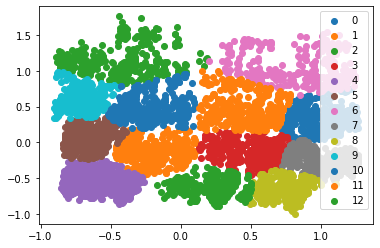

In [48]:
for i in unique_labels:
    plt.scatter(df[label == i , 0] , df[label == i , 1] , label = i)
plt.legend()
plt.show()

## Section 2 (DBSCAN)

We store the address of the dataset in a variable to maintain a clean code.

In [49]:
EARTHQUAKE_DATA_PATH = 'data/earthquake_ir.csv'

In [50]:
earthquake_df = pd.read_csv(EARTHQUAKE_DATA_PATH)

We use the `head` method to get the first five rows of each dataframe to get a general idea of each column and its values.

In [51]:
earthquake_df.head()

,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,net,id,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-04-14T03:45:58.966Z,32.0636,50.0818,10.0,4.5,mb,49.0,62.0,7.640,0.70,us,us6000k48e,2023-04-14T04:10:53.040Z,"50 km WSW of F?rs?n, Iran",earthquake,3.40,1.869,0.081,45.0,reviewed,us,us
1,2023-04-07T23:38:12.647Z,28.1032,56.9952,10.0,4.1,mb,55.0,51.0,3.224,0.49,us,us6000k43x,2023-04-16T03:29:38.040Z,"108 km N of M?n?b, Iran",earthquake,4.98,1.882,0.088,35.0,reviewed,us,us
2,2023-04-04T14:53:08.017Z,28.2978,56.9272,10.0,4.0,mb,25.0,144.0,3.401,0.94,us,us6000k1xv,2023-04-04T16:27:10.040Z,"109 km S of K?h Sef?d, Iran",earthquake,13.03,1.950,0.126,17.0,reviewed,us,us
3,2023-04-03T03:55:02.834Z,28.0114,56.9150,10.0,4.3,mb,50.0,108.0,3.119,0.43,us,us6000k1n3,2023-04-03T04:15:26.040Z,NaN,earthquake,10.57,1.906,0.086,38.0,reviewed,us,us
4,2023-04-02T07:55:27.919Z,27.1929,52.9741,10.0,4.4,mb,40.0,86.0,3.667,0.56,us,us6000k1gg,2023-04-02T08:20:38.040Z,NaN,earthquake,8.41,1.898,0.095,32.0,reviewed,us,us


We limit our set of features only to latitude and longitude. Since we have only two features which are latitude and longitude, we can plot them using a scatter plot. This would provide us with information on how our data is scattered geographically.

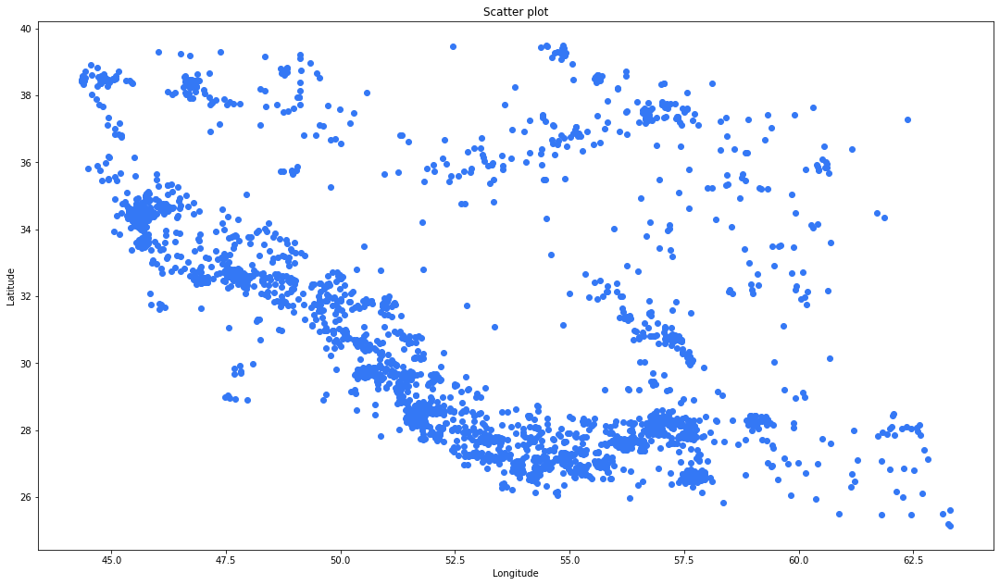

In [52]:
fig, ax = plt.subplots()

fig = plt.gcf()
fig.set_size_inches(18.5, 10.5)

ax.scatter(earthquake_df['longitude'], earthquake_df['latitude'], color='#3478F5')

ax.set_title('Scatter plot')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

plt.show()

In [53]:
data = earthquake_df[['longitude', 'latitude']]

We need to find the best hyper parameters for our clustering task. For this reason, we need to test a range of epsilon values and min_samples to find the best values. For epsilon we consider a range with lower limit of 0.1 and upper limit of 0.9 and a step of 0.1. For min_samples_range we consider a range with lower limit of 1 and upper limit of 30 and a step of 1. We try each combination and calculate the silhouette score to find he best hyper parameters. In the following we implement what we mentioned earlier.

In [54]:
eps_range = np.arange(0.1, 1.9, 0.1)
min_samples_range = np.arange(1, 30, 1)

In [55]:
results = []
for eps in eps_range:
    for min_samples in min_samples_range:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(earthquake_df[['longitude', 'latitude']])
        labels = db.labels_
        results.append([eps, min_samples, silhouette_score(earthquake_df[['longitude', 'latitude']], labels)])

In [56]:
results.sort(key=lambda x: x[2], reverse=True)

Here, we can see all the combination eps and min_samples values with their corresponding silhouette_score. As we can see the best eps value is 1.8 and best min_samples value is 26 with the silhouette_score of 0.387174.

In [57]:
data = pd.DataFrame(results, columns=['eps', 'min_samples', 'silhouette_score'])
data

,eps,min_samples,silhouette_score
0,1.8,26,0.387174
1,1.8,27,0.387174
2,1.5,20,0.370569
3,1.4,2,0.352422
4,1.4,3,0.352422
...,...,...,...
517,0.1,28,-0.466708
518,0.1,29,-0.470140
519,0.3,1,-0.471379
520,0.4,1,-0.488495


In DBSCAN clustering algorithm what is the effect of different values (too little or too much) of epsilon or min_points in clustering?

Depending on how small the epsilon value is, many points may be marked as outliers, and the clustering will be fragmented. However, if the epsilon value is too large, then clusters will merge and the algorithm will be unable to detect fine-grained structures.

Choosing a small value for min_points may cause all points to be marked as core points, and the algorithm will lose its ability to distinguish between noise and outliers. On the other hand, setting a large value for min_points will cause many points to be marked as noise and the clusters will be fragmented.

We define two functions. The first one is get_results, which applies DBSCAN algorithm based on two parameters which are eps and min_samples and resturns labels for each sample and prints some usefule informations.

In [58]:
def get_results(eps, min_samples):
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(earthquake_df[['longitude', 'latitude']])
    labels = db.labels_

    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    print(f"Silhouette Coefficient: {silhouette_score(earthquake_df[['longitude', 'latitude']], labels):.3f}")
    
    return labels

The second function is print_clusters which takes three inputs which are eps, min_samples, labels and plots the clusters and corresponding points in each of them.

In [59]:
def print_clusters(eps, min_samples, labels):
    # Plot the resulting clusters
    fig, ax = plt.subplots()

    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)

    ax.scatter(earthquake_df['longitude'], earthquake_df['latitude'], c=labels, s=50, cmap='viridis')
    ax.set_title(f'DBSCAN clusters with eps={eps} and min_samples={min_samples}')
    plt.show()

Here, we plot 52 of the best results based on the Silhouette Coefficient so that we can understand and evaluate the results better.

Estimated number of clusters: 1
Estimated number of noise points: 3
Silhouette Coefficient: 0.387


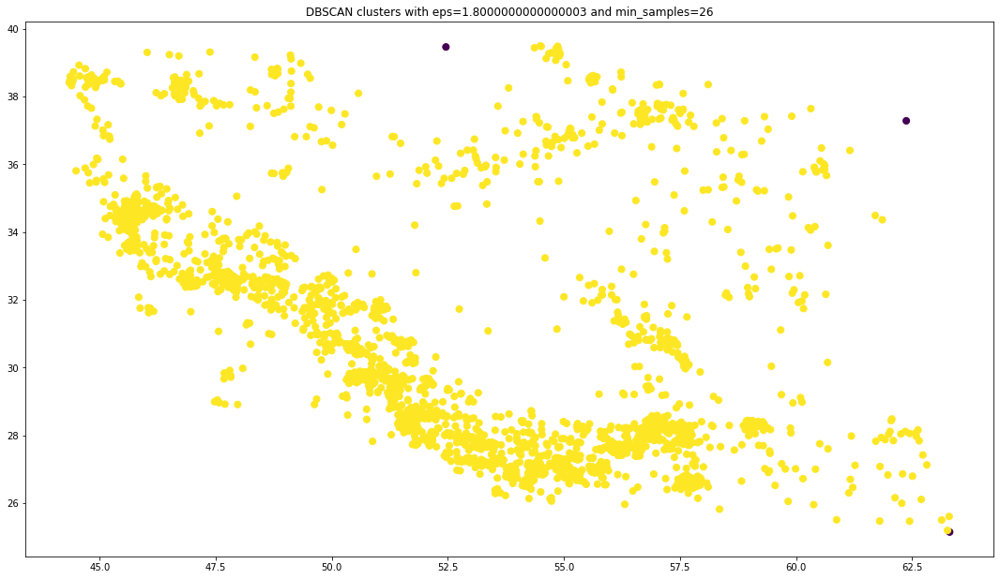

Estimated number of clusters: 1
Estimated number of noise points: 3
Silhouette Coefficient: 0.387


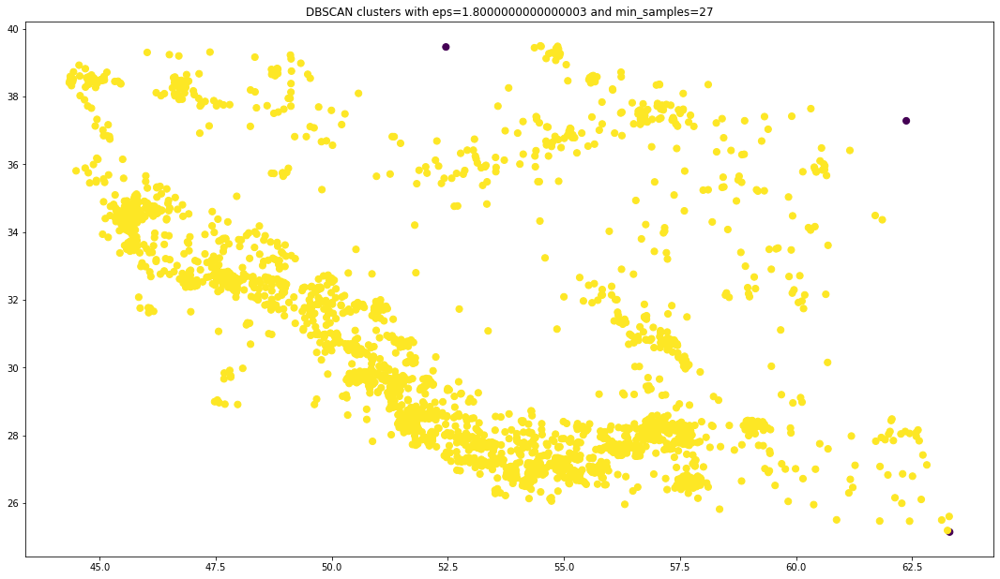

Estimated number of clusters: 1
Estimated number of noise points: 6
Silhouette Coefficient: 0.371


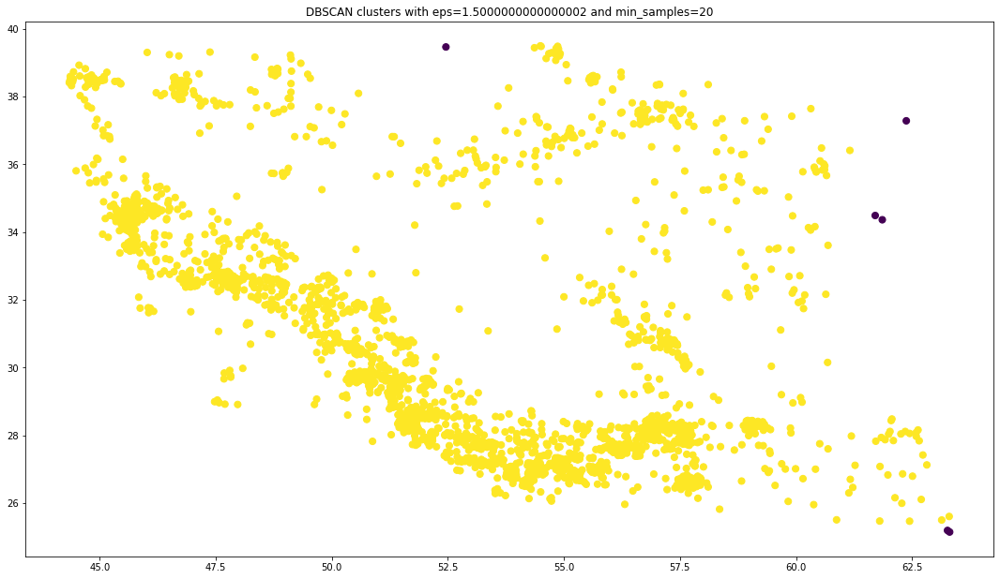

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


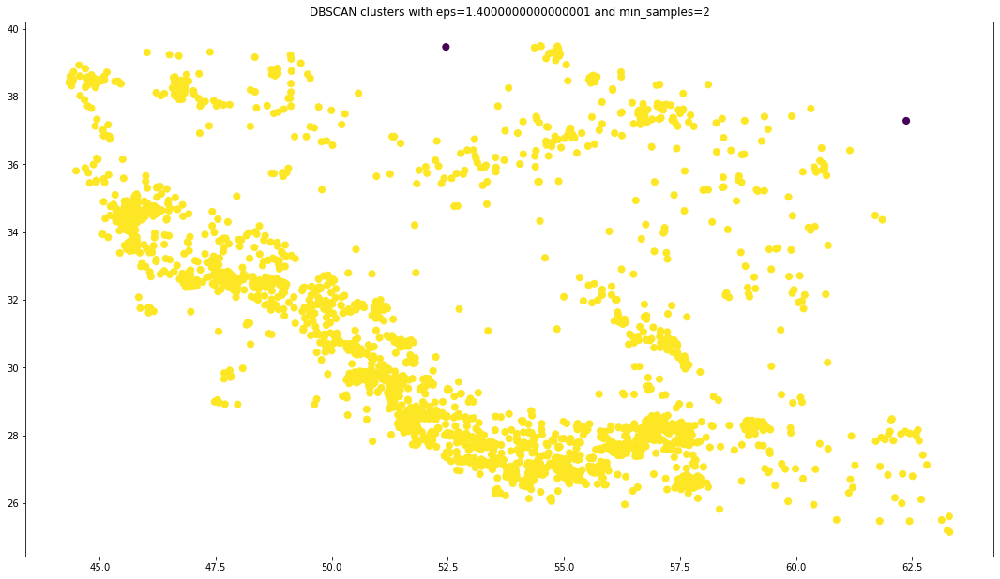

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


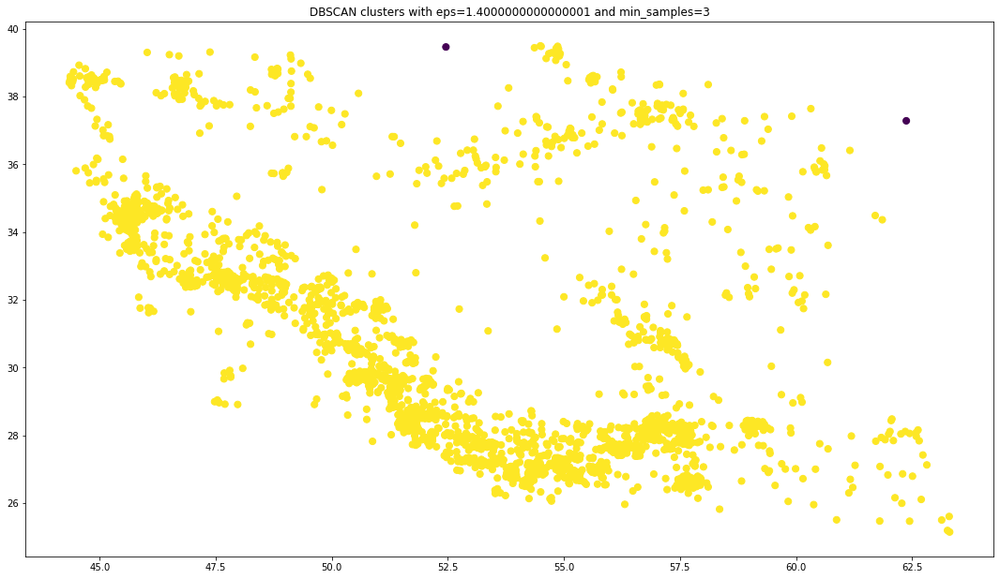

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


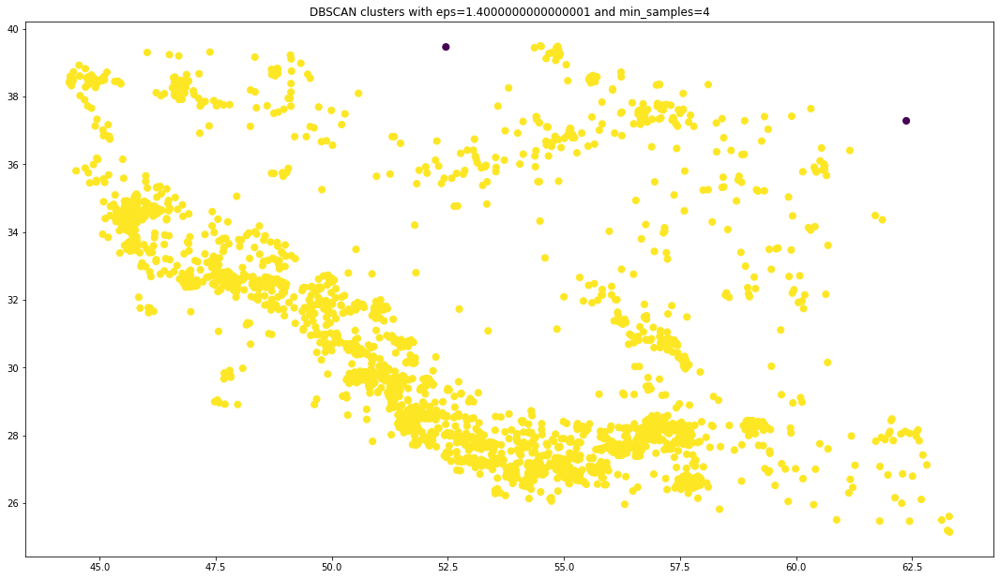

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


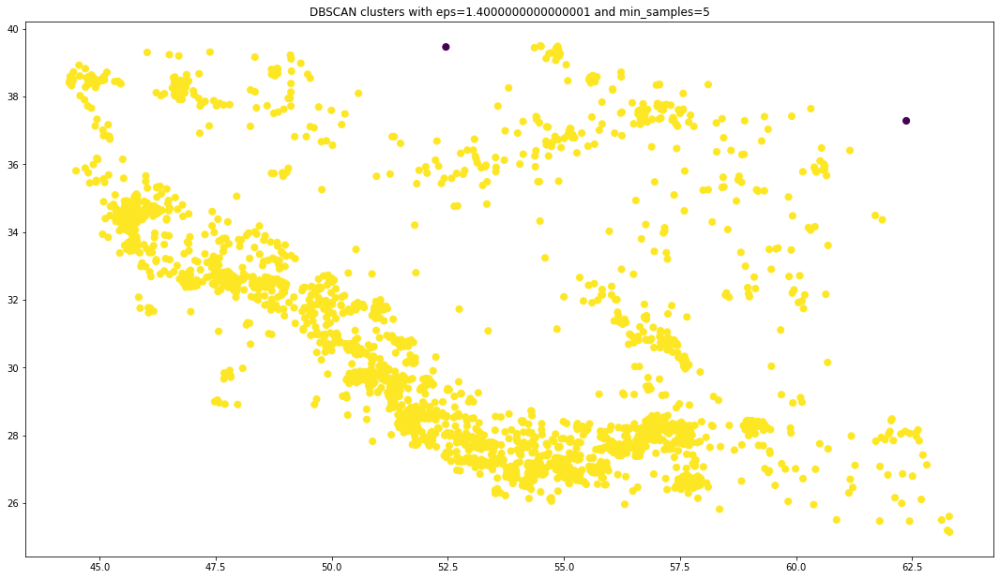

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


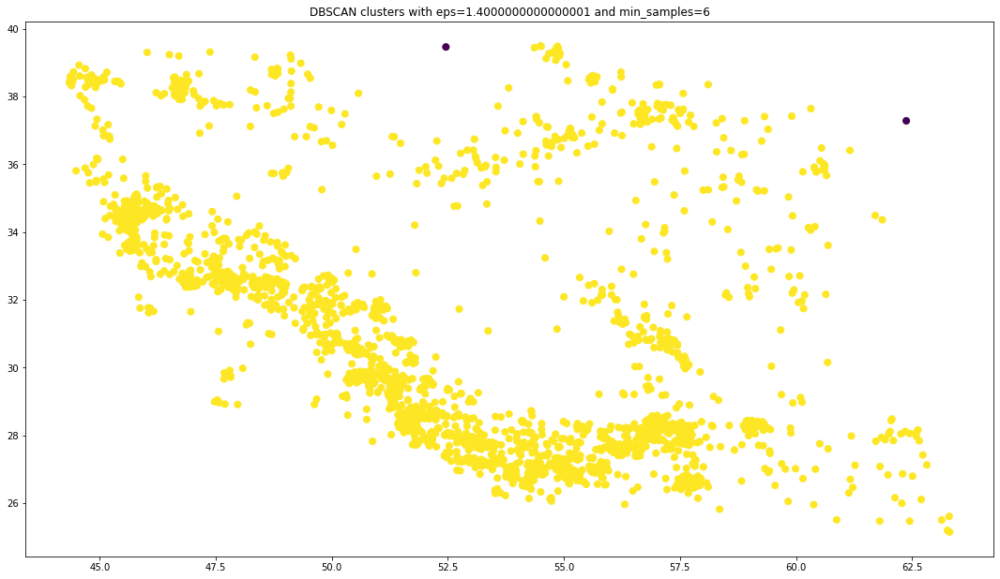

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


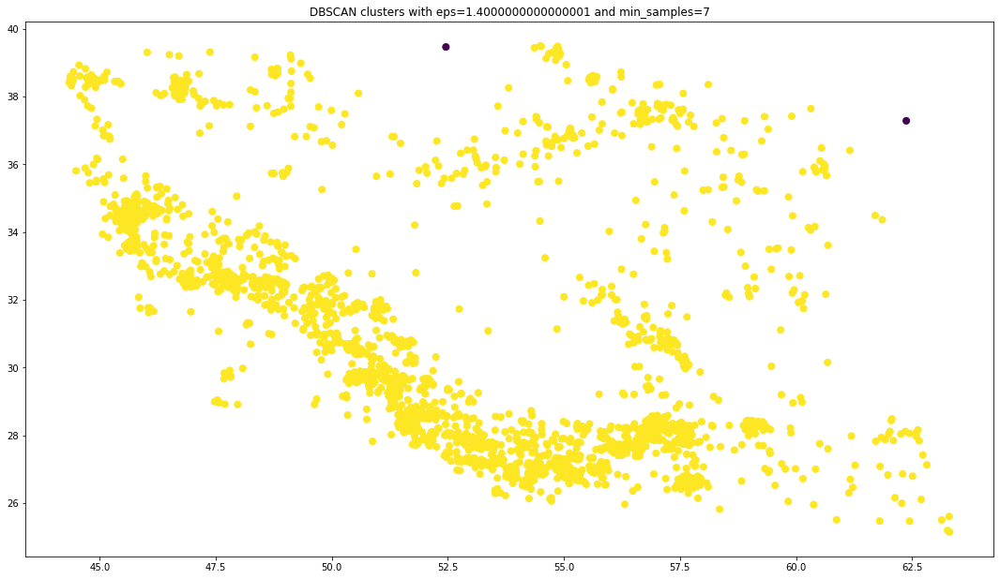

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


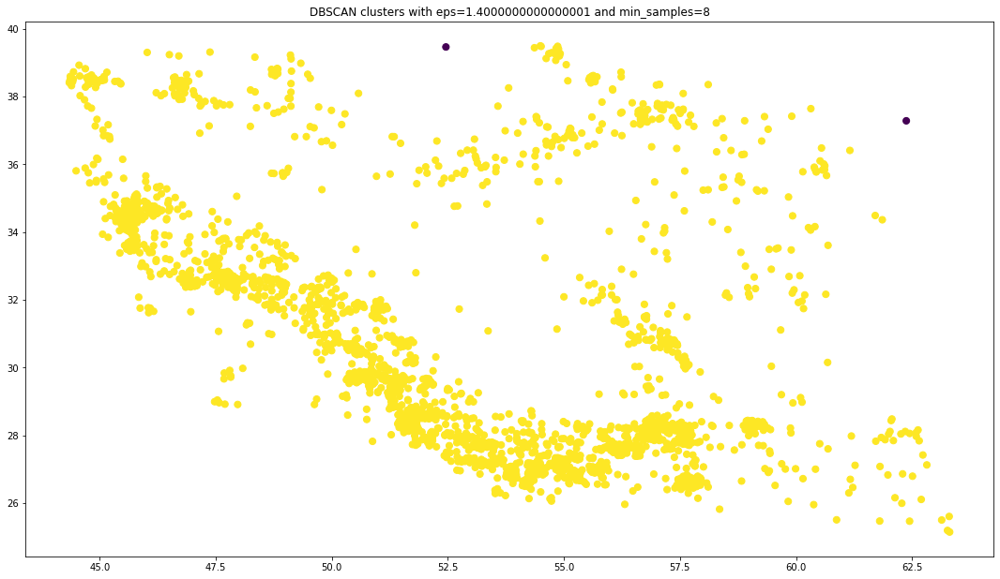

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


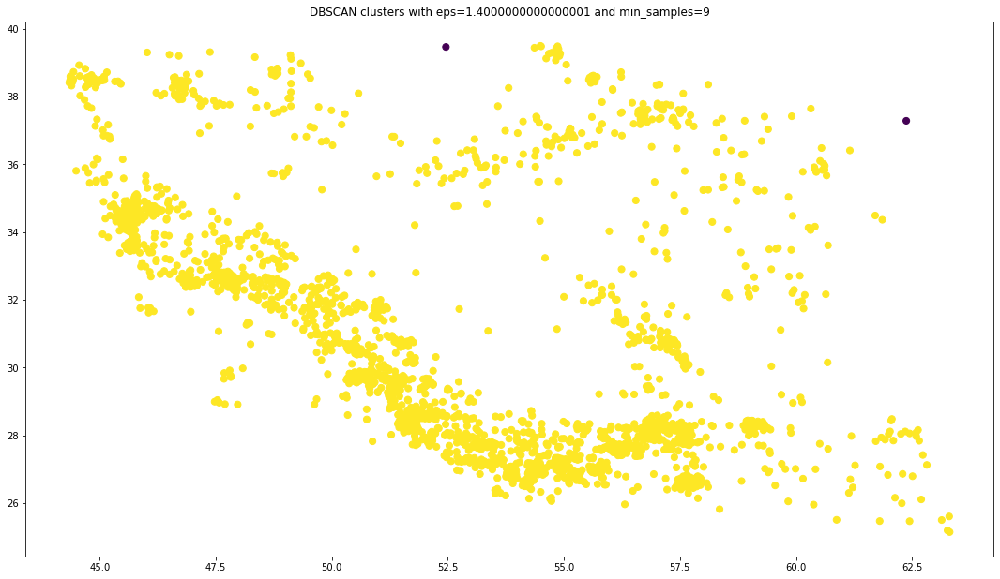

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


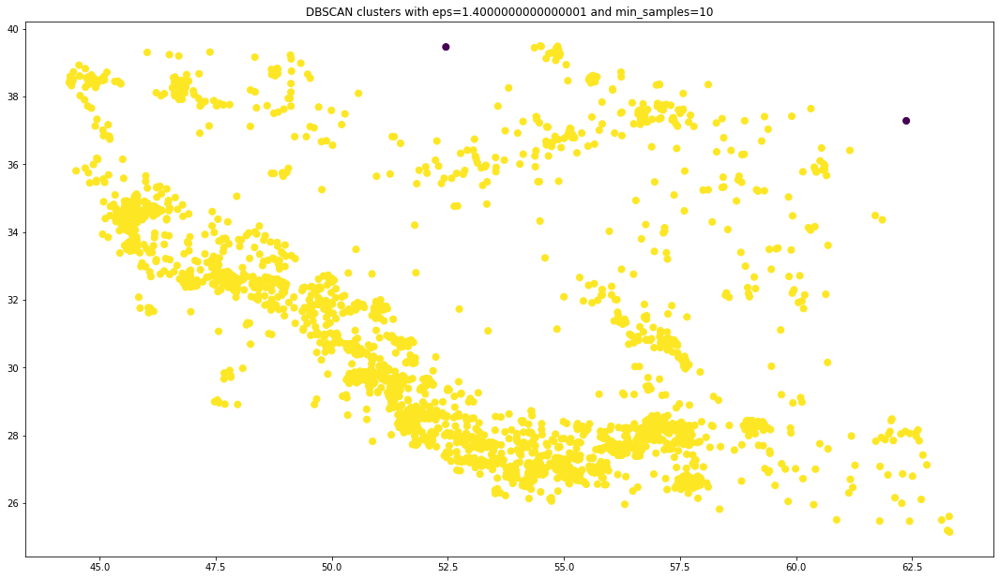

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


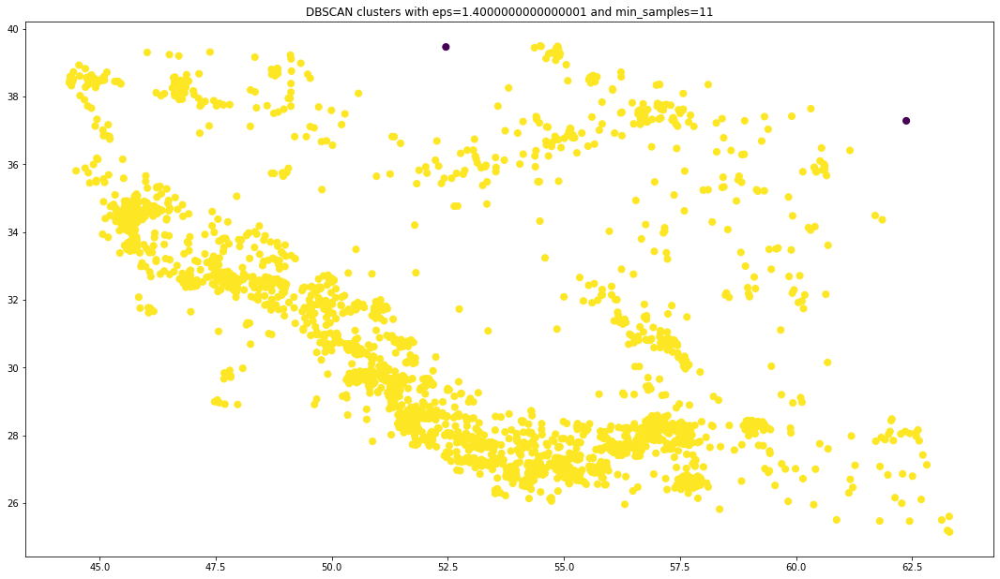

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


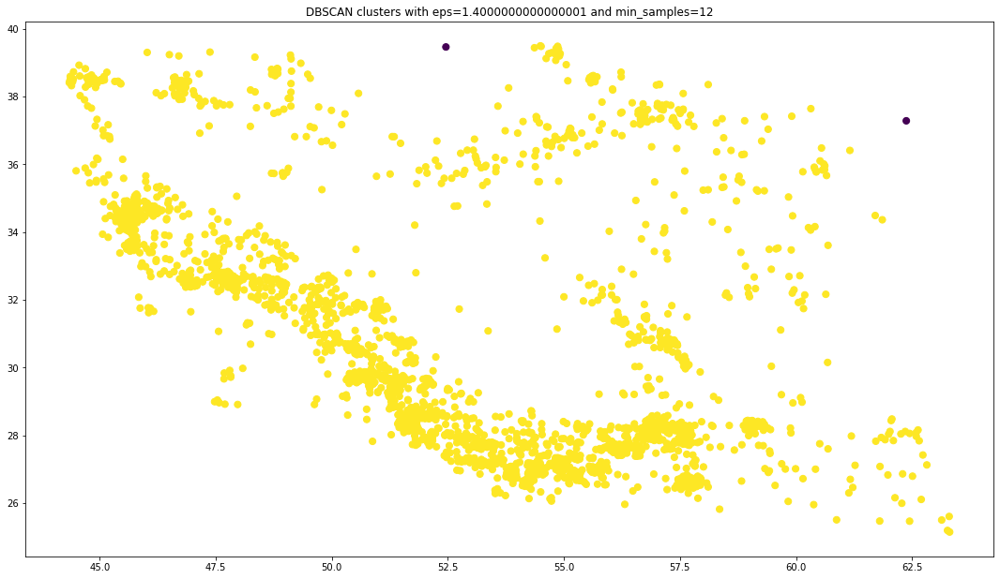

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


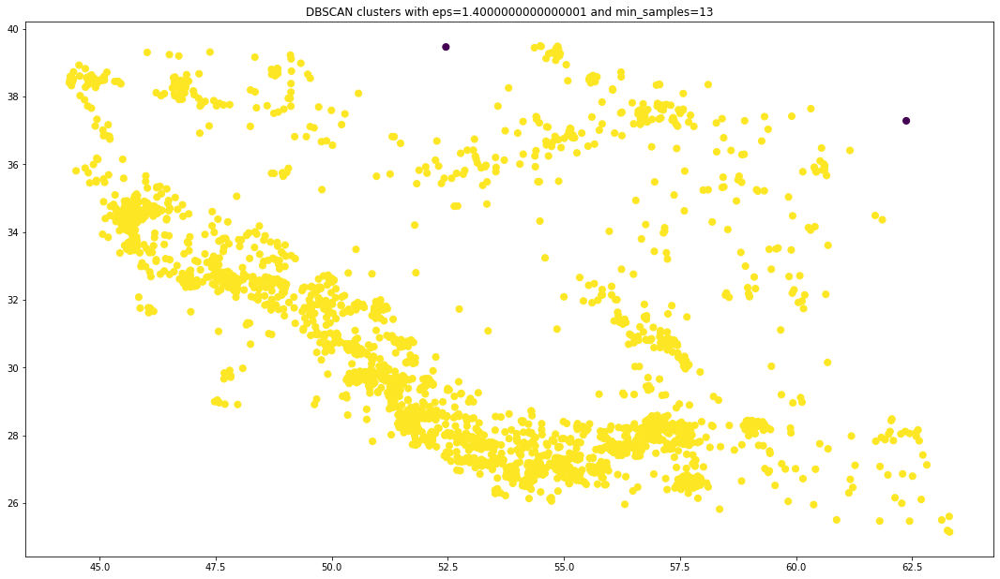

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


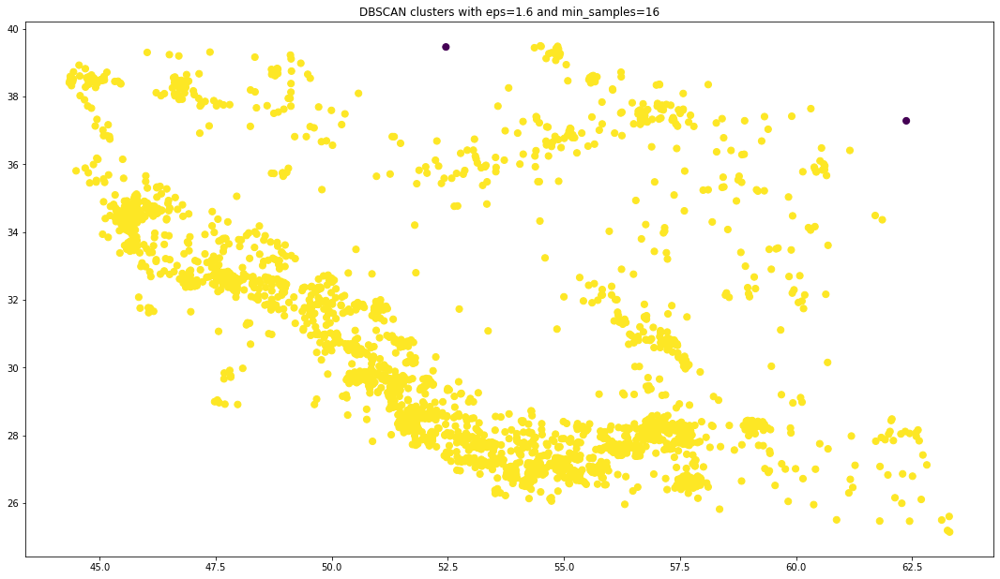

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


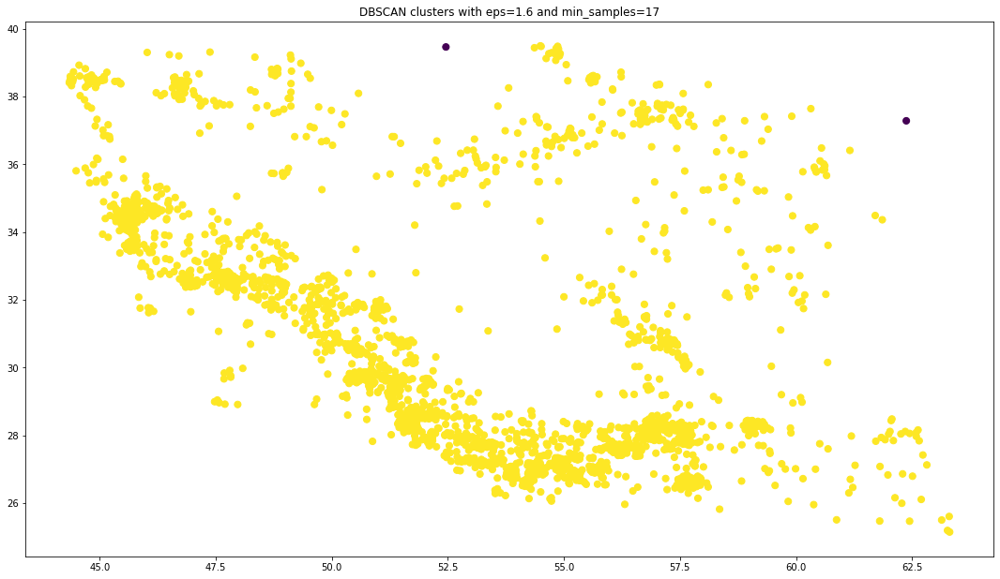

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


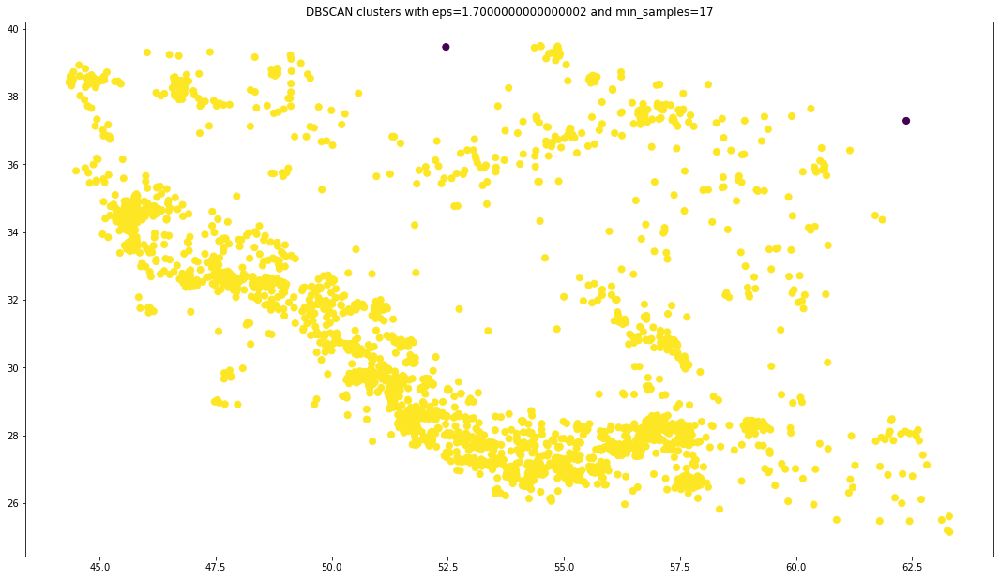

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


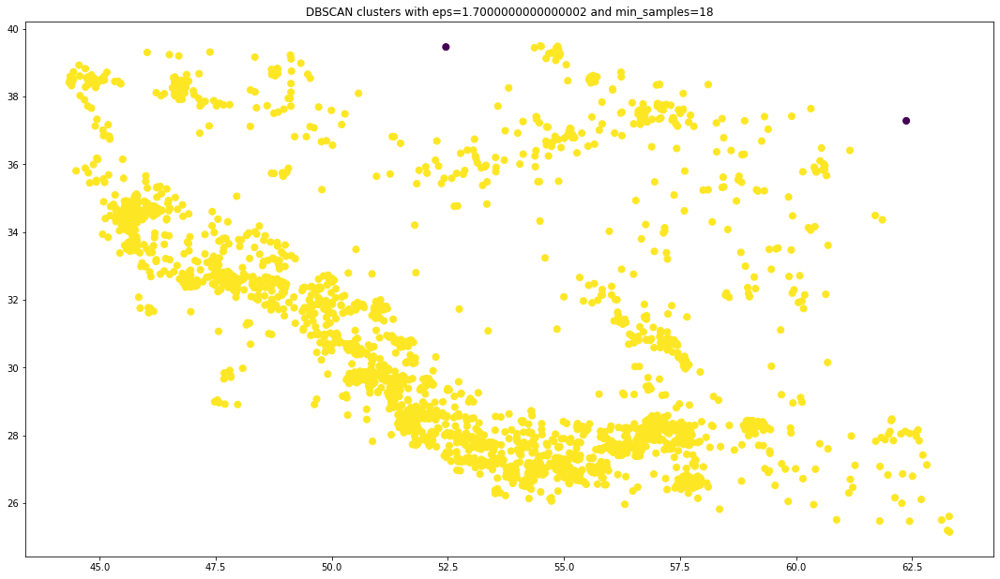

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


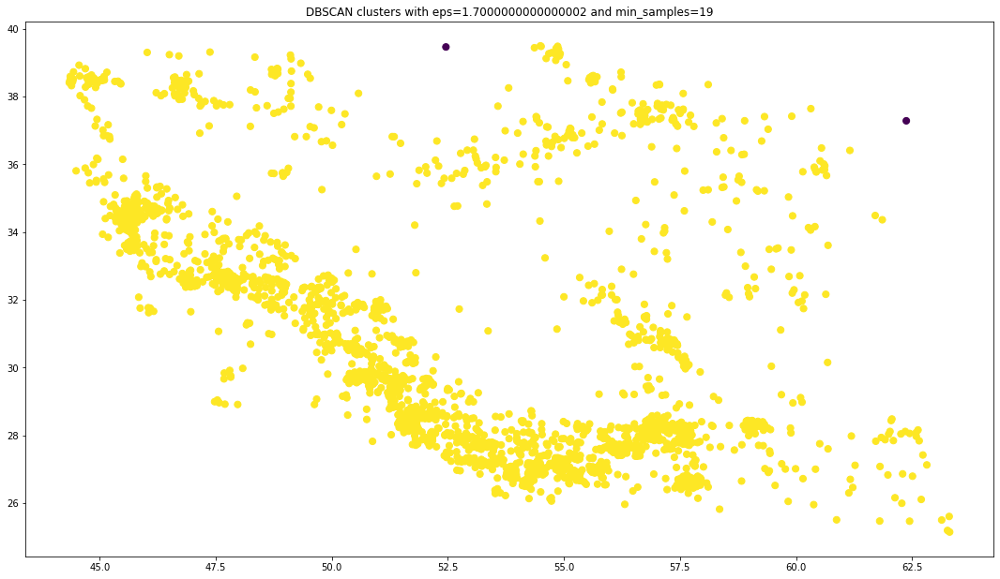

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


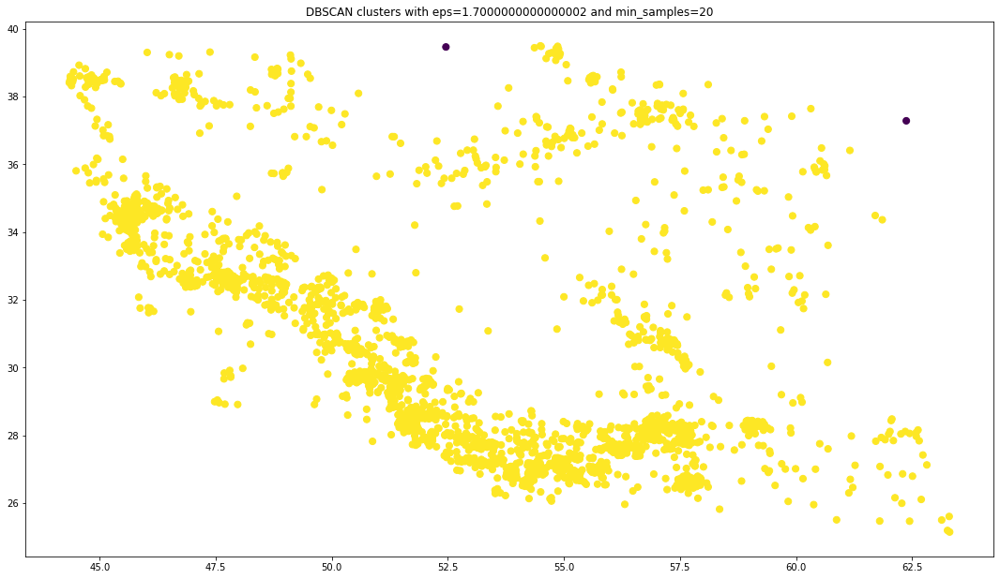

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


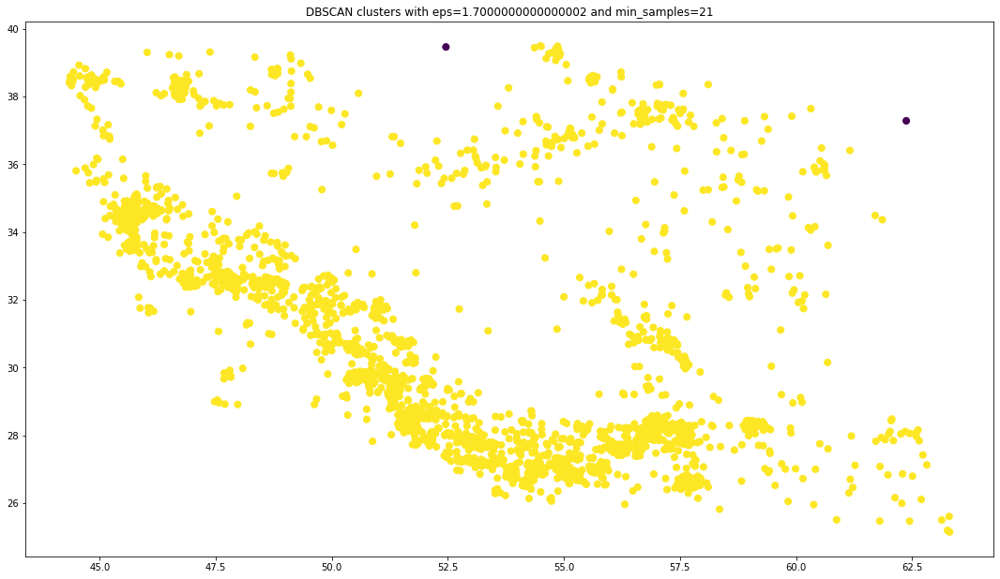

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


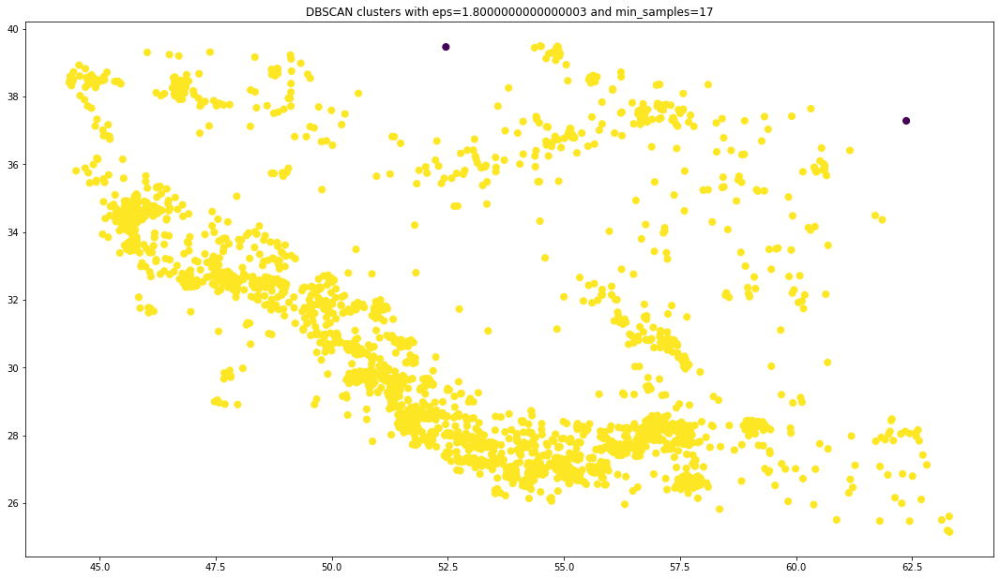

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


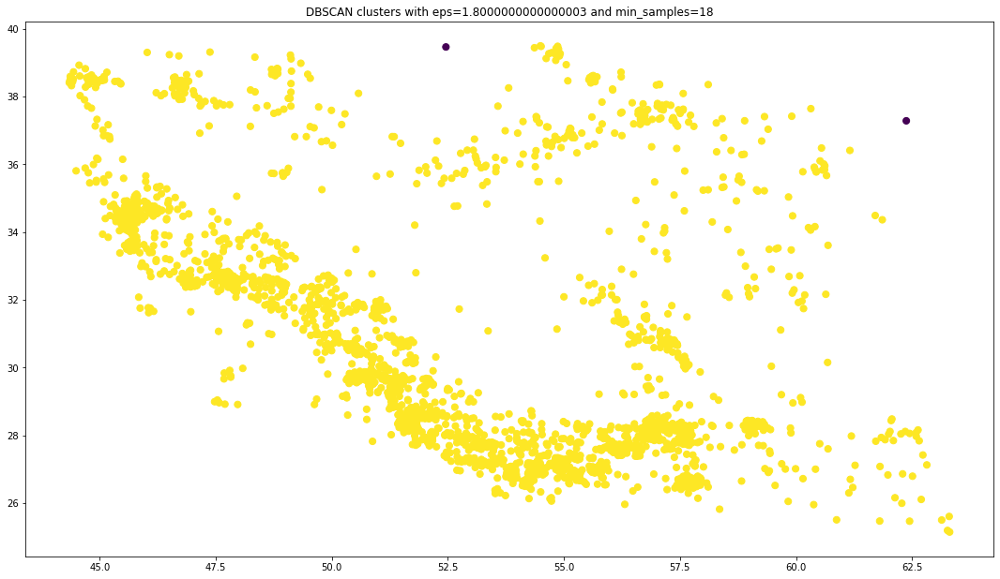

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


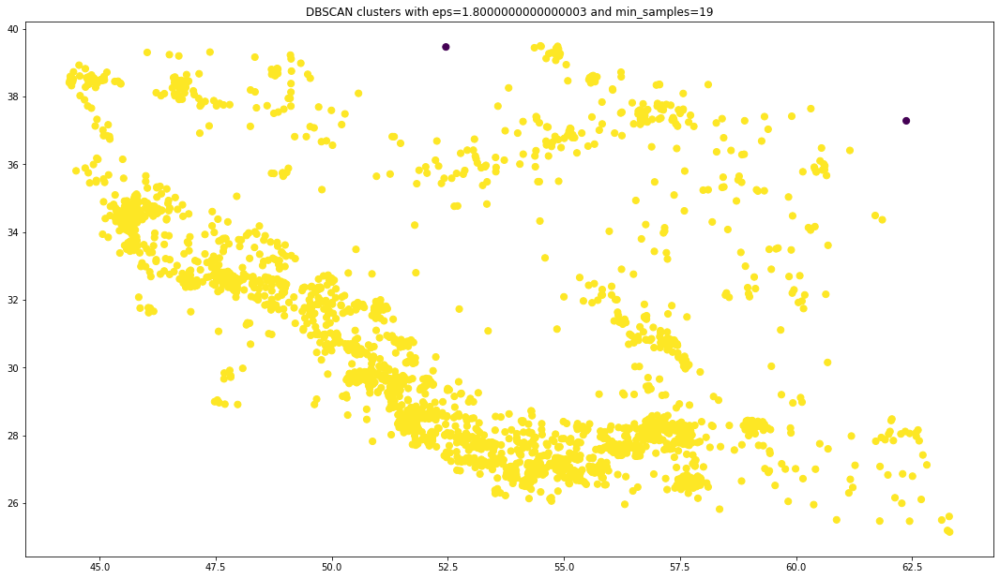

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


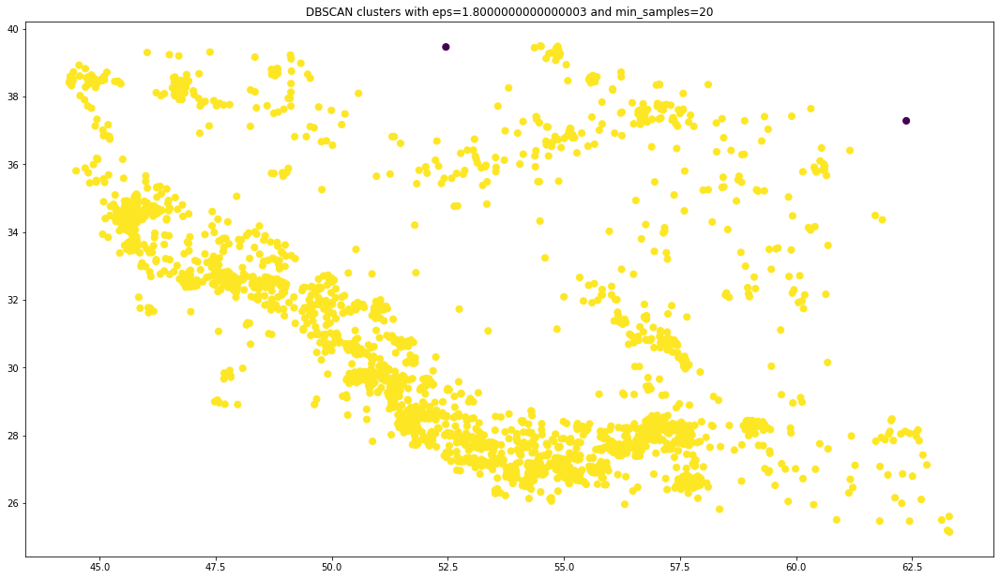

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


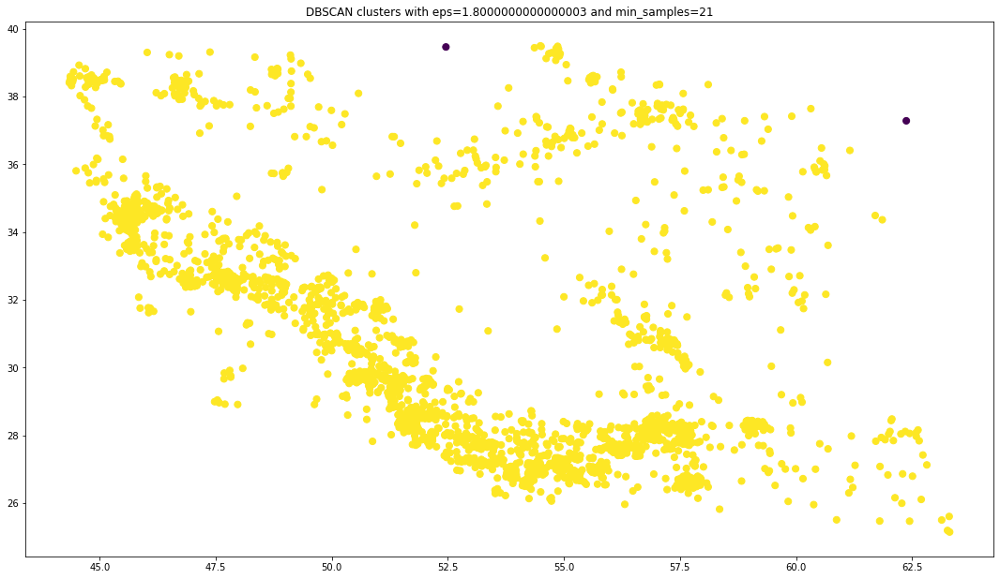

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


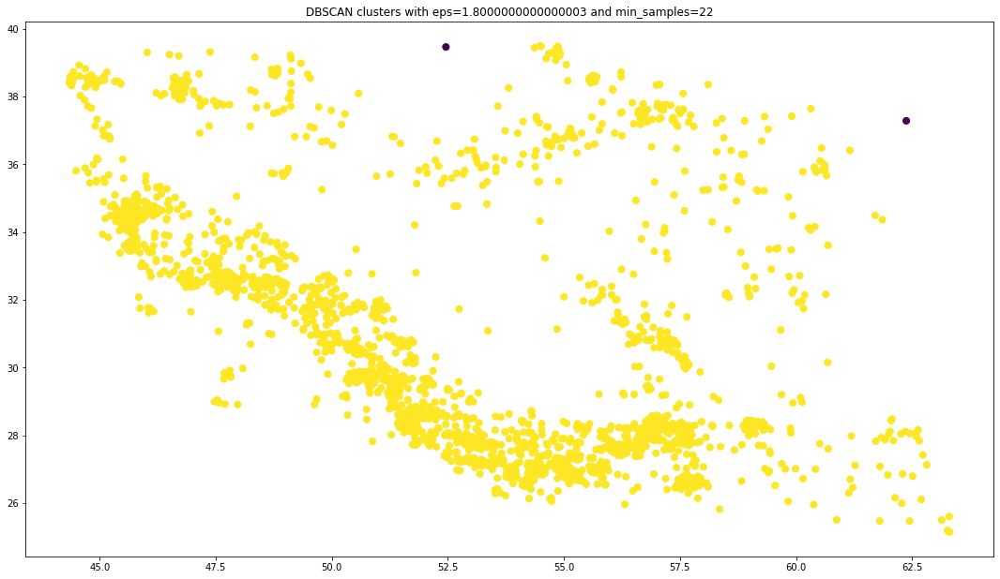

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


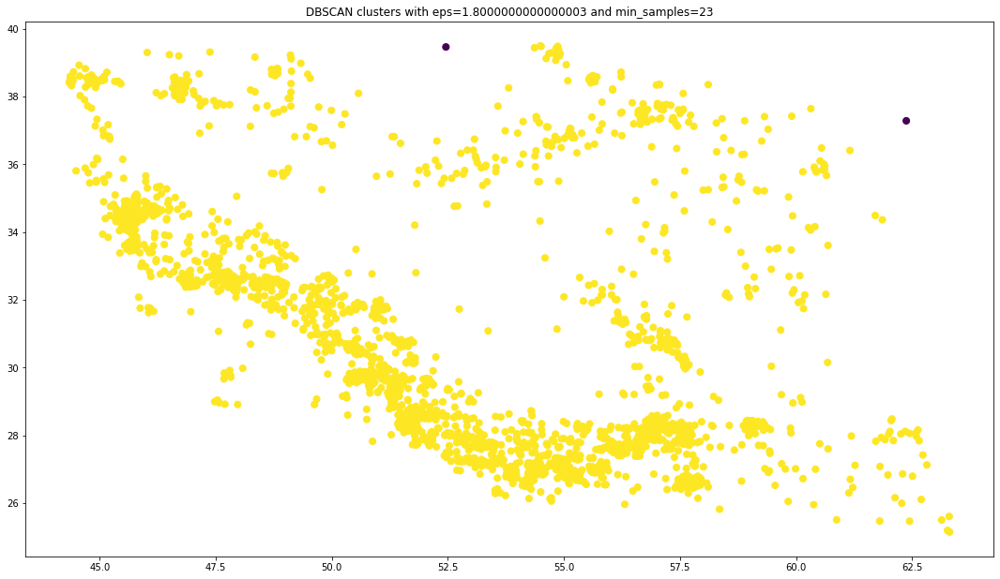

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


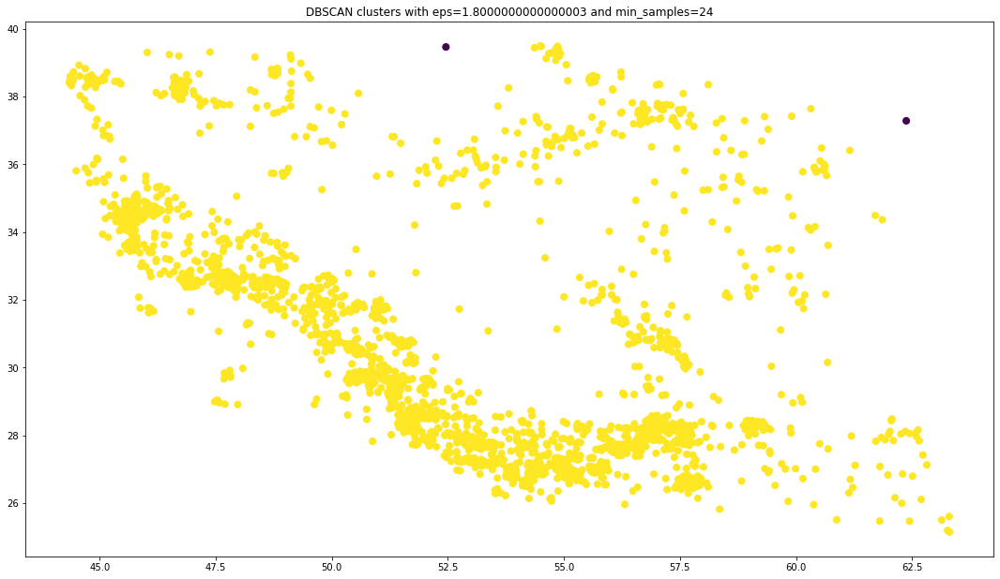

Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.352


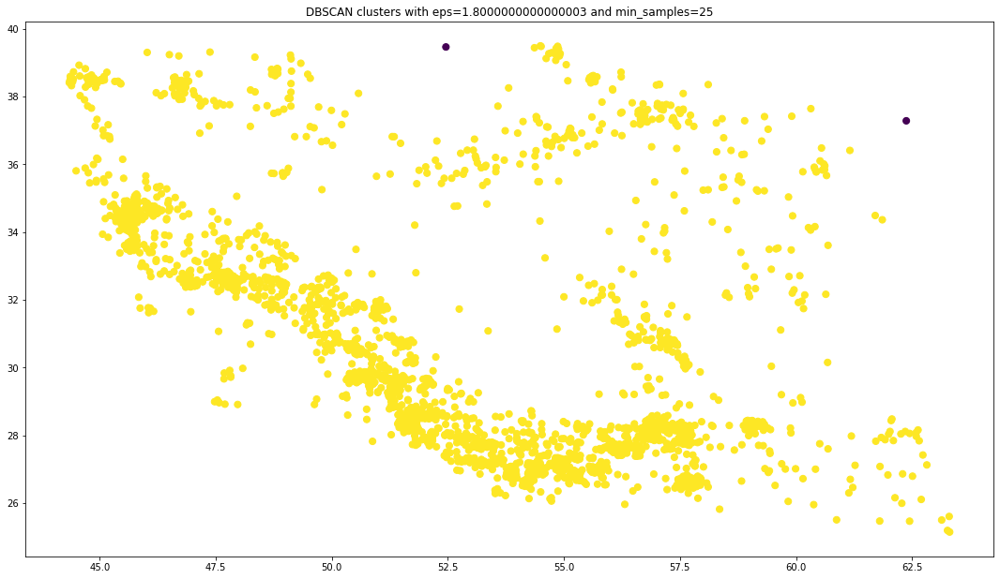

Estimated number of clusters: 1
Estimated number of noise points: 3
Silhouette Coefficient: 0.350


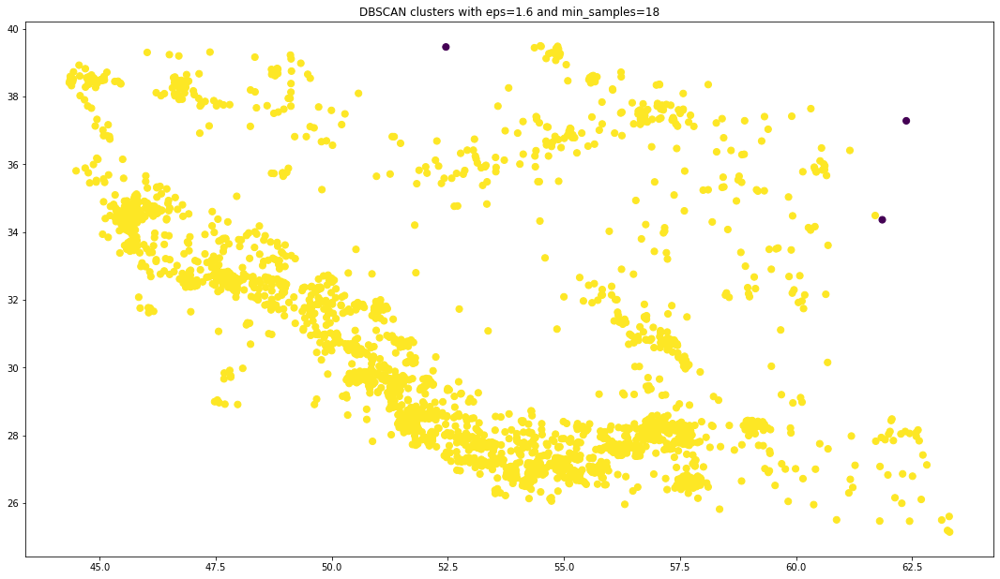

Estimated number of clusters: 1
Estimated number of noise points: 3
Silhouette Coefficient: 0.350


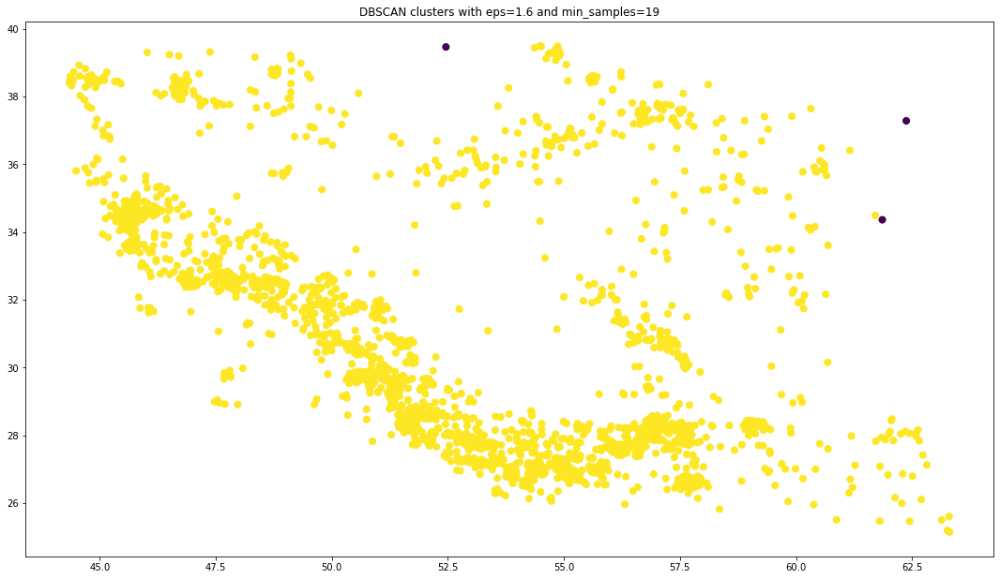

Estimated number of clusters: 1
Estimated number of noise points: 3
Silhouette Coefficient: 0.350


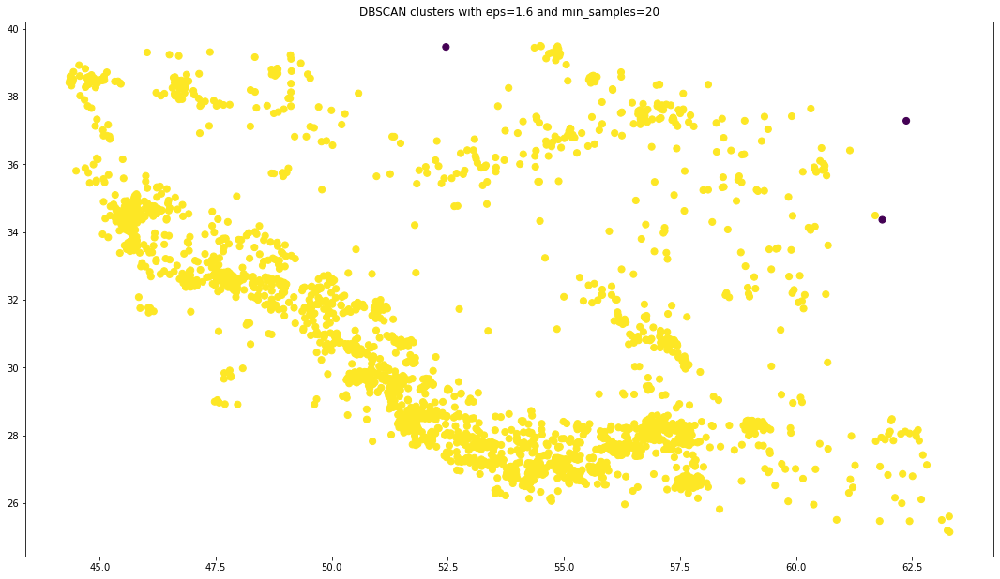

Estimated number of clusters: 1
Estimated number of noise points: 4
Silhouette Coefficient: 0.344


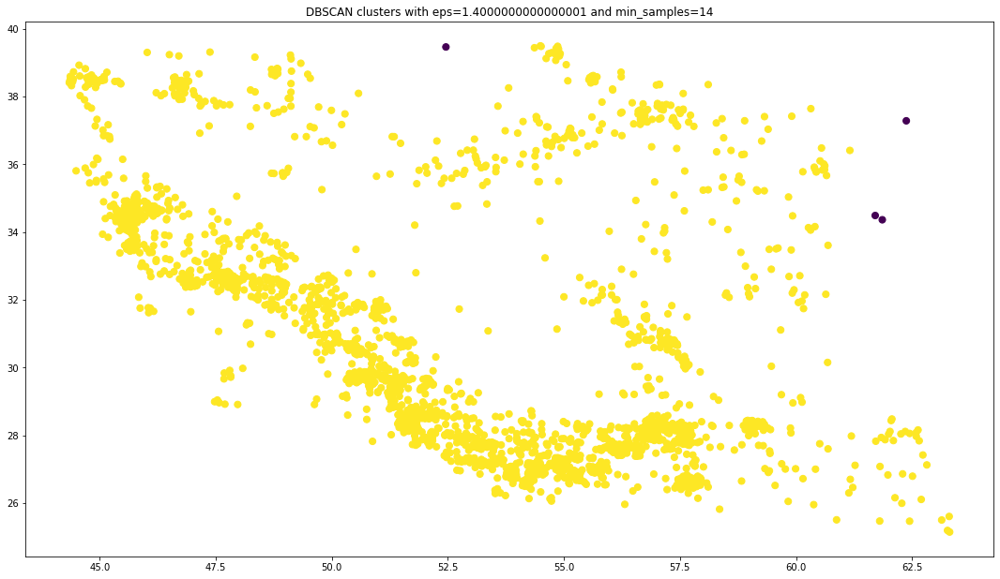

Estimated number of clusters: 1
Estimated number of noise points: 4
Silhouette Coefficient: 0.344


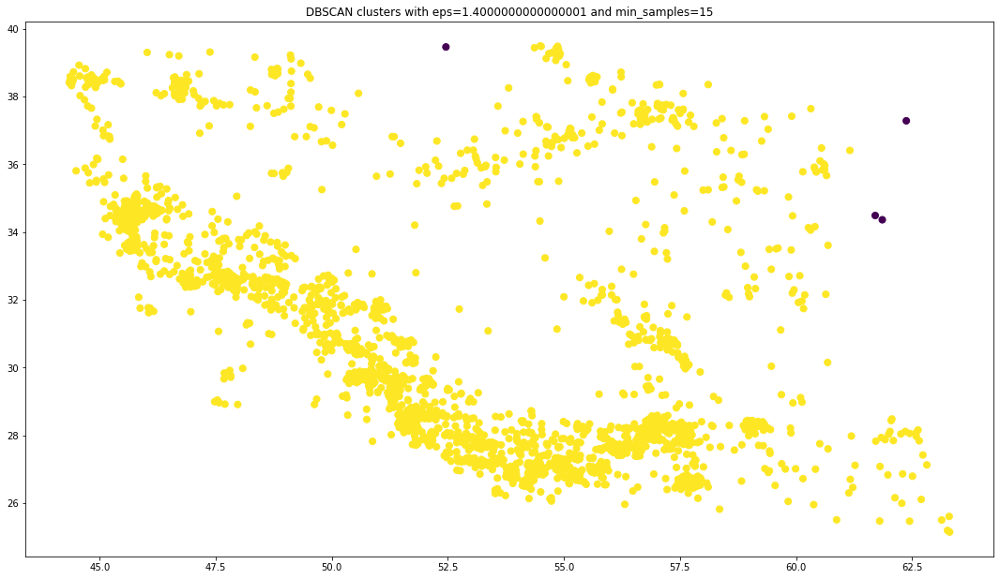

Estimated number of clusters: 1
Estimated number of noise points: 4
Silhouette Coefficient: 0.344


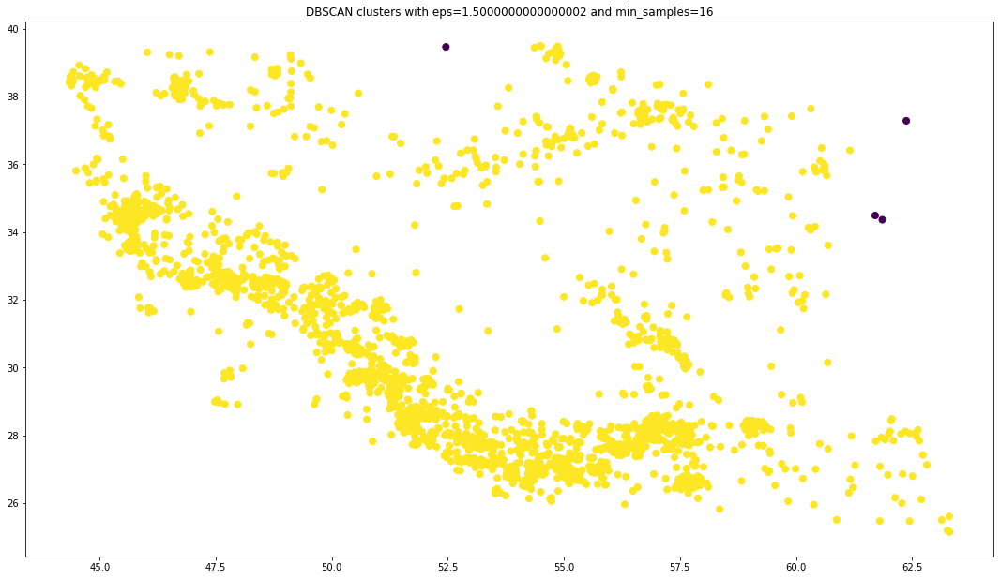

Estimated number of clusters: 1
Estimated number of noise points: 4
Silhouette Coefficient: 0.344


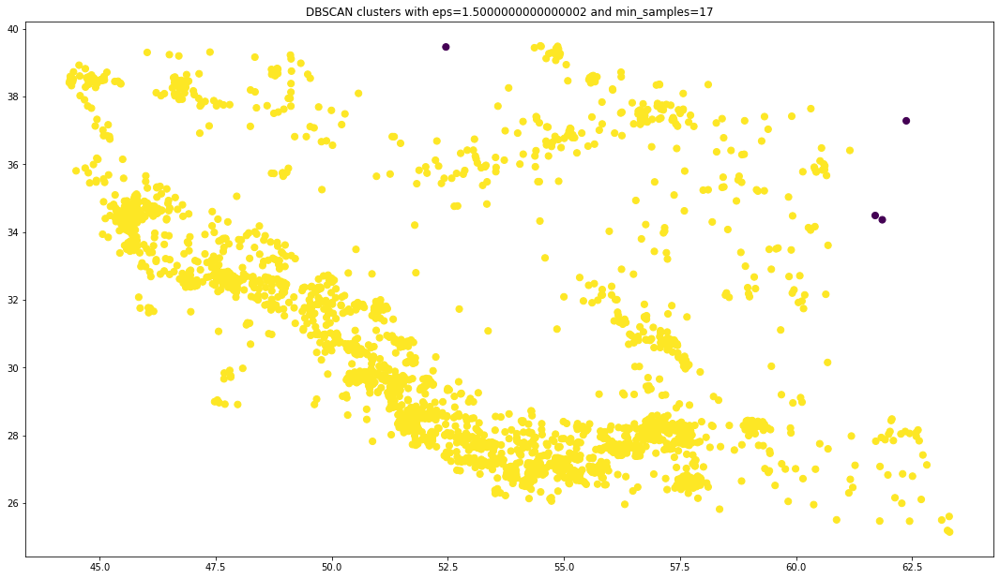

Estimated number of clusters: 1
Estimated number of noise points: 4
Silhouette Coefficient: 0.344


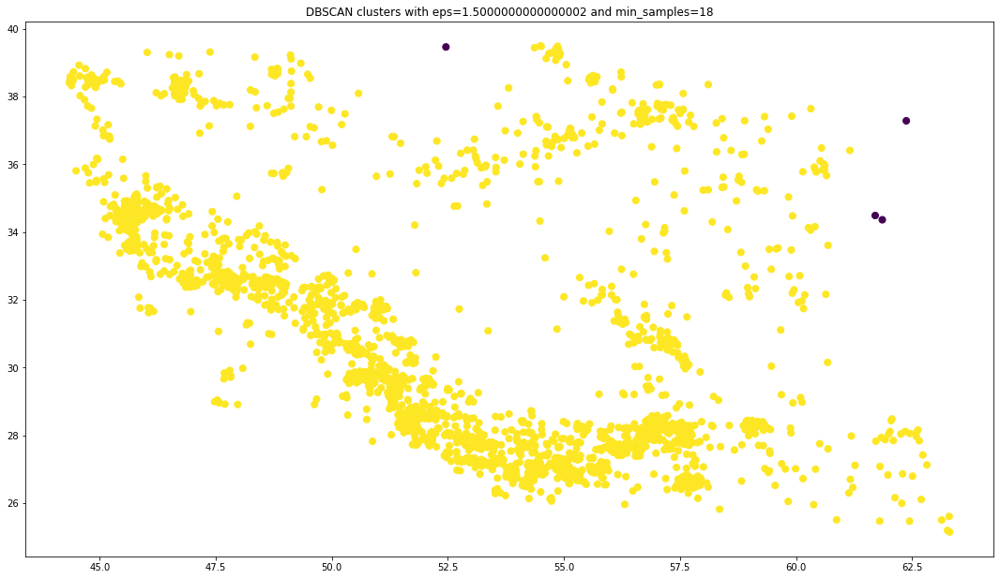

Estimated number of clusters: 1
Estimated number of noise points: 4
Silhouette Coefficient: 0.344


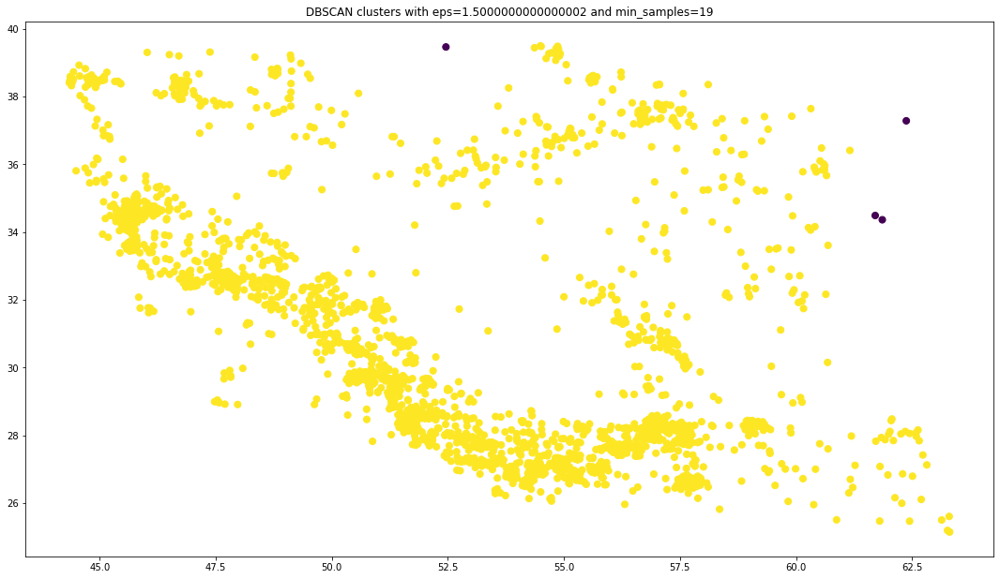

Estimated number of clusters: 2
Estimated number of noise points: 9
Silhouette Coefficient: 0.306


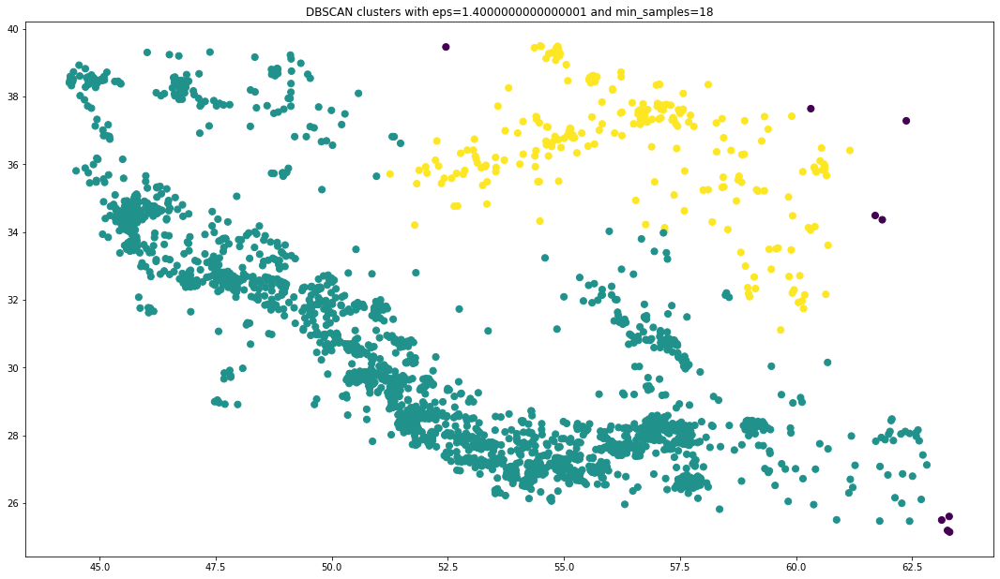

Estimated number of clusters: 2
Estimated number of noise points: 9
Silhouette Coefficient: 0.306


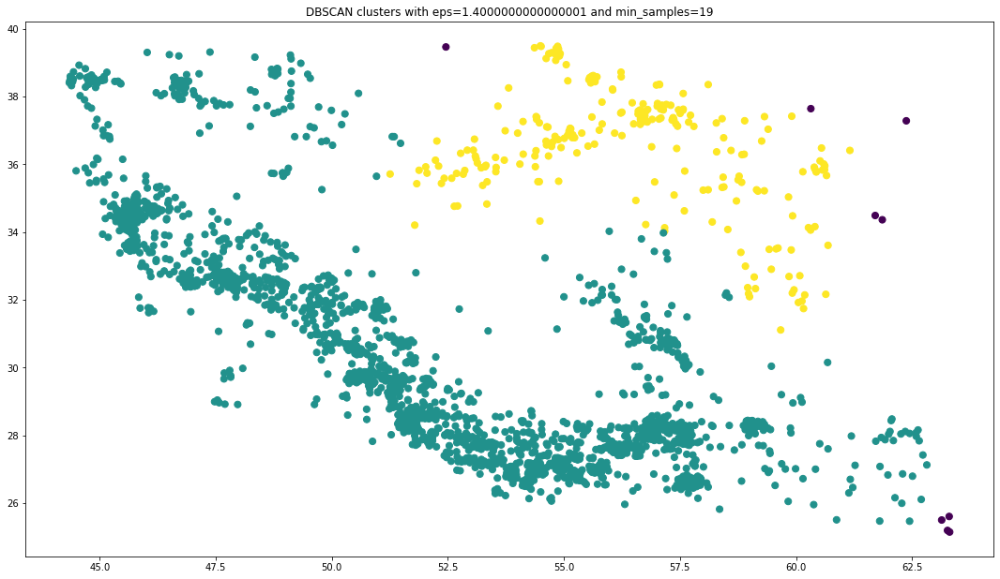

Estimated number of clusters: 2
Estimated number of noise points: 4
Silhouette Coefficient: 0.306


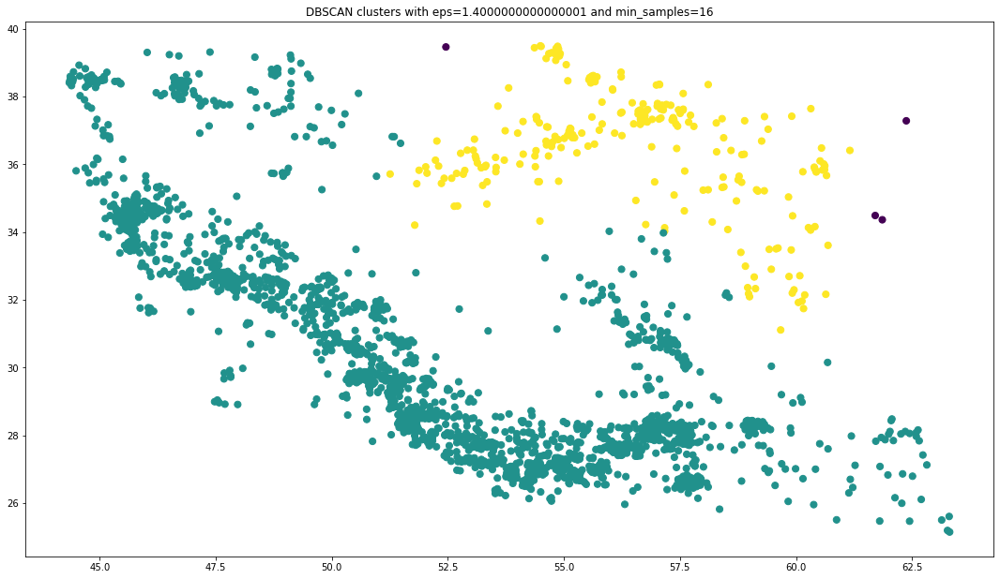

Estimated number of clusters: 2
Estimated number of noise points: 4
Silhouette Coefficient: 0.306


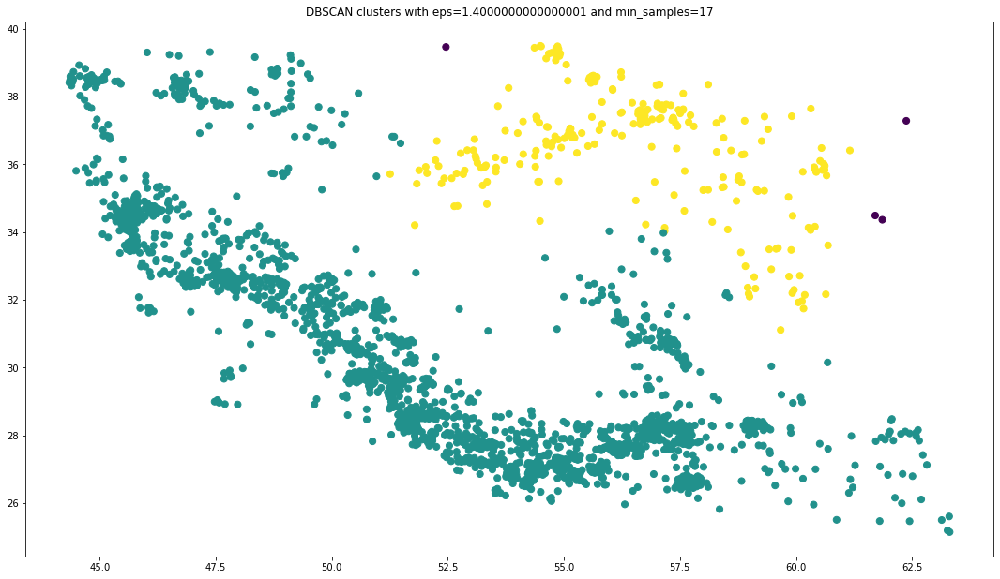

Estimated number of clusters: 2
Estimated number of noise points: 11
Silhouette Coefficient: 0.302


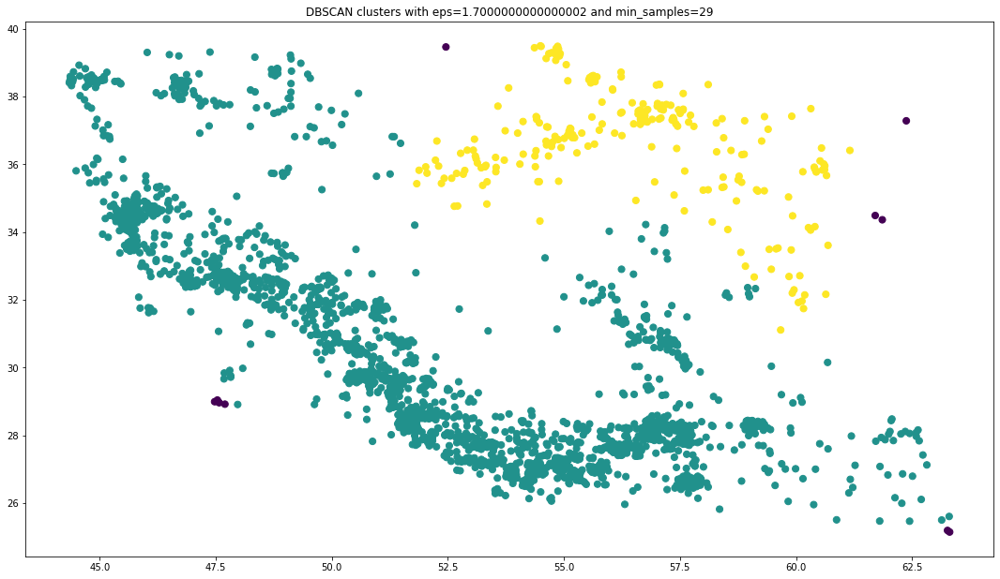

Estimated number of clusters: 2
Estimated number of noise points: 13
Silhouette Coefficient: 0.300


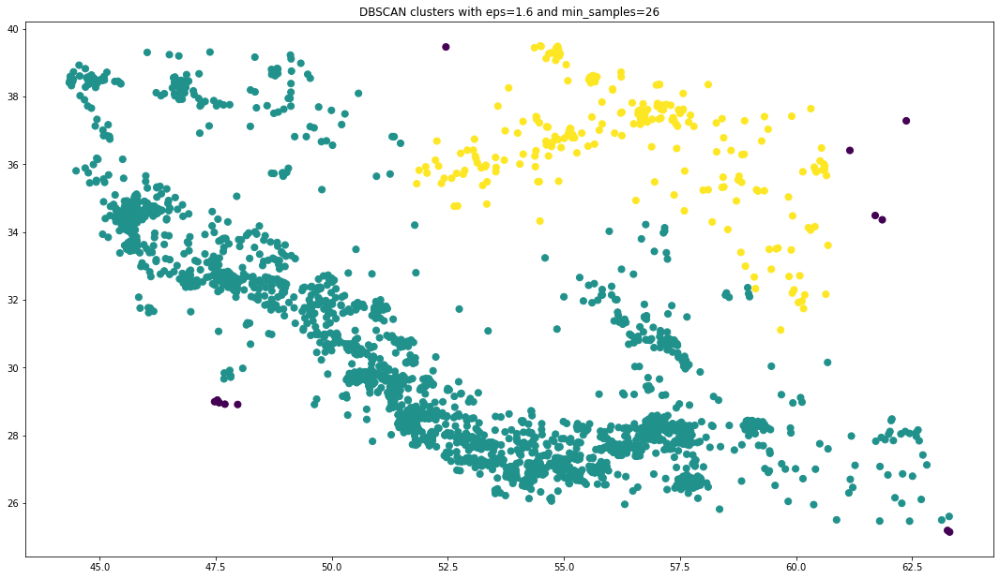

Estimated number of clusters: 2
Estimated number of noise points: 13
Silhouette Coefficient: 0.300


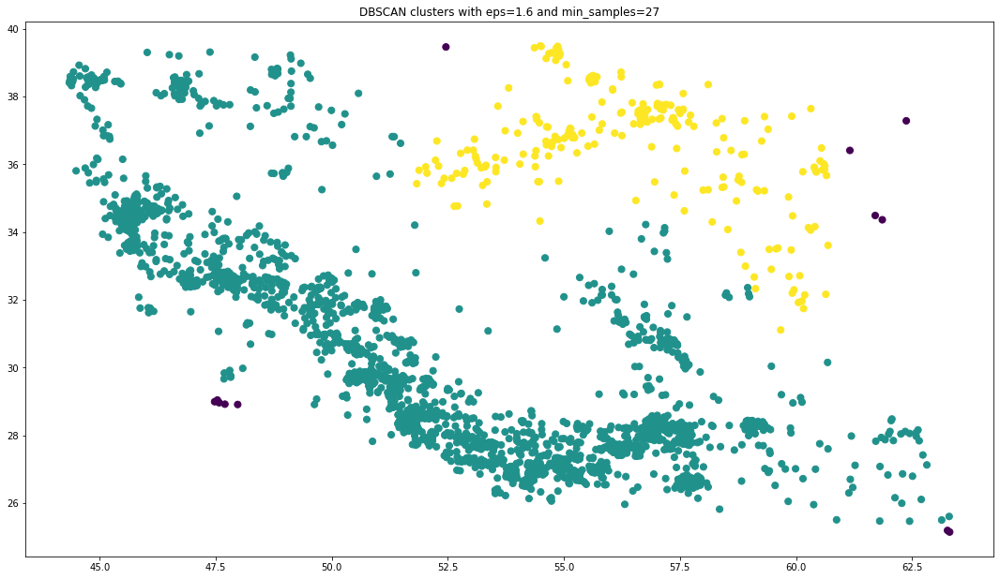

Estimated number of clusters: 2
Estimated number of noise points: 13
Silhouette Coefficient: 0.300


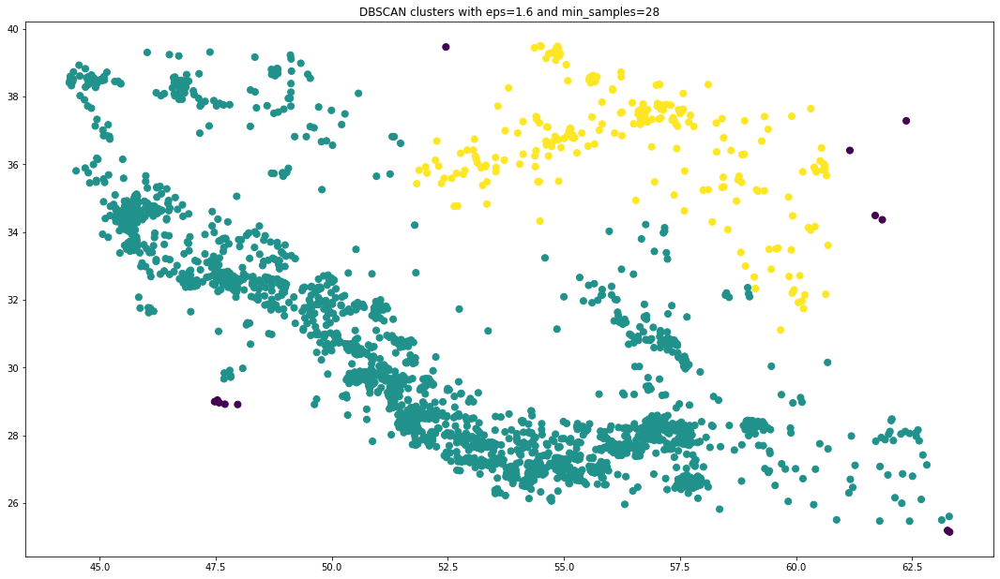

Estimated number of clusters: 2
Estimated number of noise points: 13
Silhouette Coefficient: 0.300


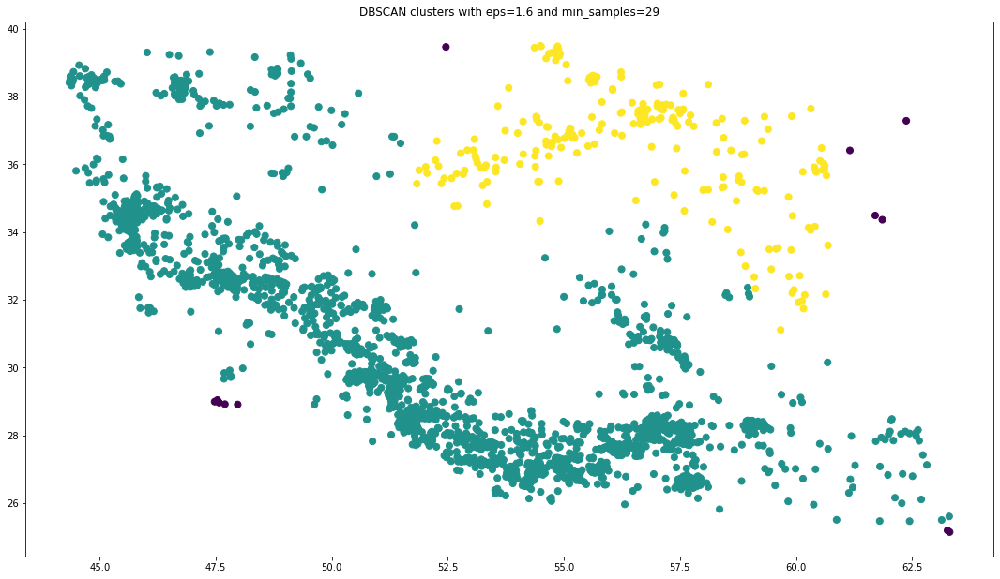

Estimated number of clusters: 2
Estimated number of noise points: 7
Silhouette Coefficient: 0.293


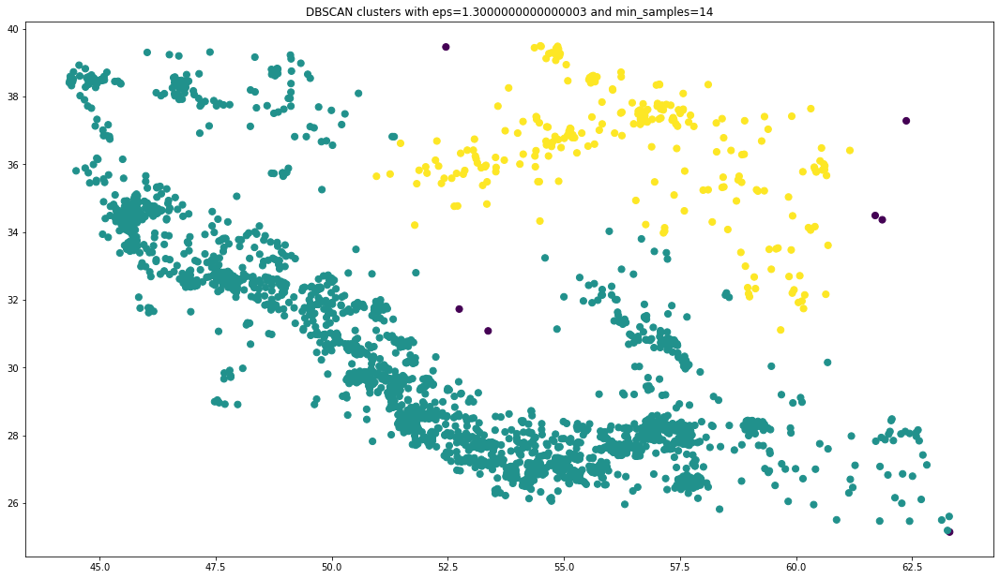

Estimated number of clusters: 2
Estimated number of noise points: 6
Silhouette Coefficient: 0.289


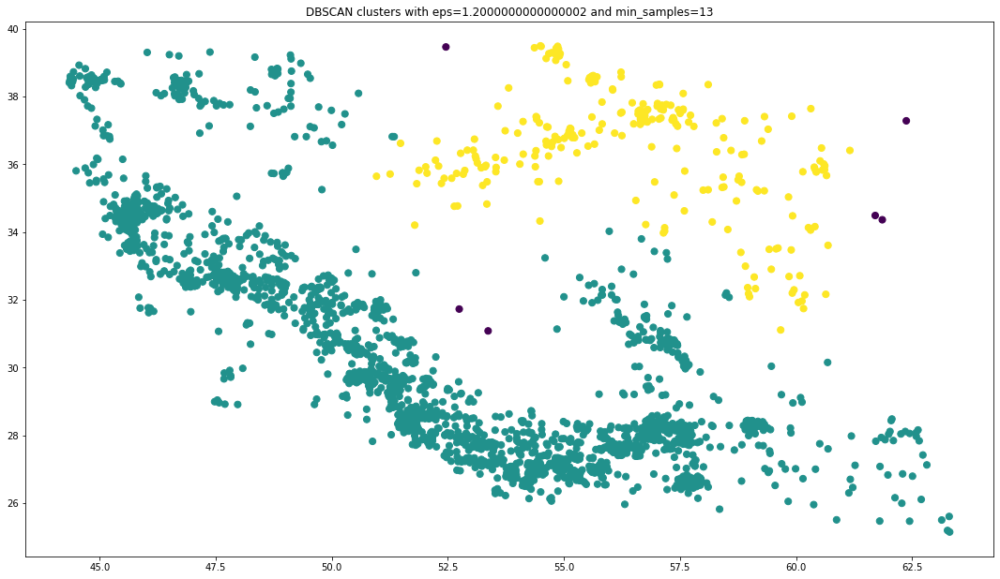

Estimated number of clusters: 2
Estimated number of noise points: 12
Silhouette Coefficient: 0.282


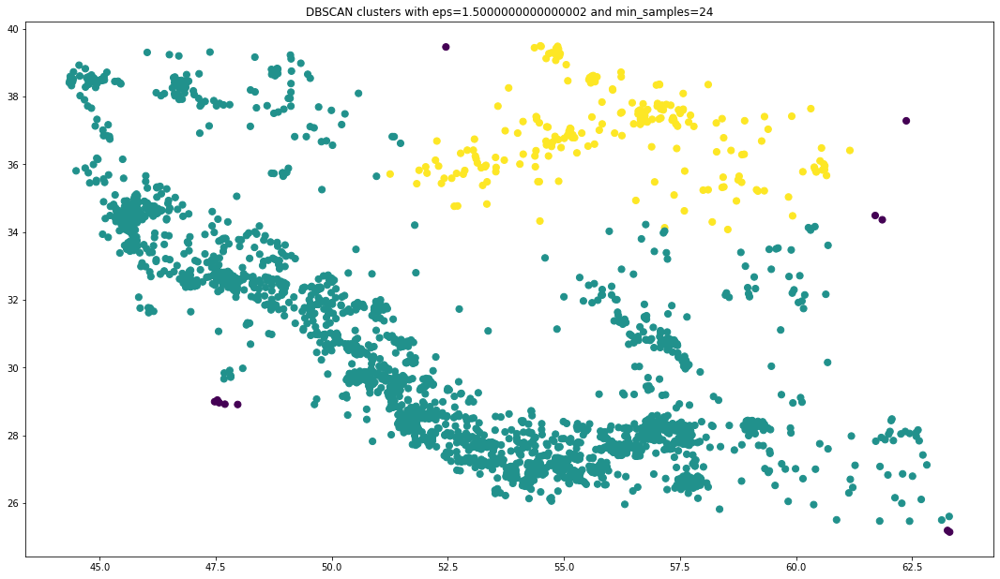

In [60]:
for i in range(52):
    labels = get_results(results[i][0], results[i][1])
    print_clusters(results[i][0], results[i][1], labels)

As suggested, by the assignment we might be able to add attributes to increase the quality of our clustering. However, not all features can be used for example in here if we also include the depth feature the quality decreases.

In [61]:
earthquake_df.select_dtypes(include= np.number).columns

Index(['latitude', 'longitude', 'depth', 'mag', 'nst', 'gap', 'dmin', 'rms',
       'horizontalError', 'depthError', 'magError', 'magNst'],
      dtype='object')

In [62]:
eps_range = np.arange(0.1, 1.9, 0.1)
min_samples_range = np.arange(1, 30, 1)

results = []
for eps in eps_range:
    for min_samples in min_samples_range:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(earthquake_df[['longitude', 'latitude', 'depth']])
        labels = db.labels_
        results.append([eps, min_samples, silhouette_score(earthquake_df[['longitude', 'latitude', 'depth']], labels)])
    
results.sort(key=lambda x: x[2], reverse=True)

data = pd.DataFrame(results, columns=['eps', 'min_samples', 'silhouette_score'])
data

,eps,min_samples,silhouette_score
0,1.8,16,0.235768
1,1.8,17,0.234032
2,1.7,15,0.232949
3,1.8,18,0.232633
4,1.7,16,0.229818
...,...,...,...
517,0.1,26,-0.474782
518,0.1,19,-0.490030
519,0.1,20,-0.494615
520,0.1,21,-0.497984


We can plot the results.

Estimated number of clusters: 2
Estimated number of noise points: 450
Silhouette Coefficient: 0.236


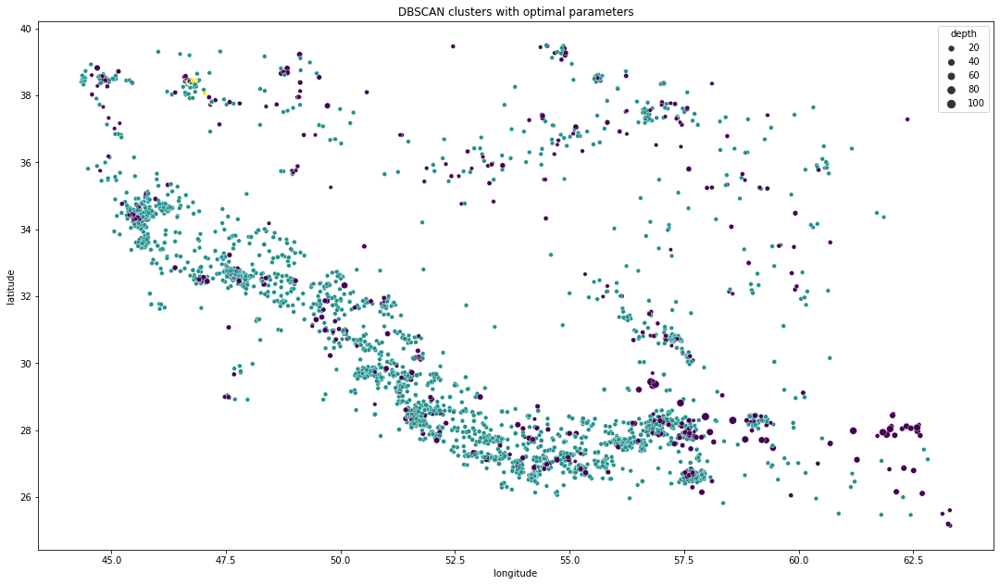

In [63]:
for feature in ['depth']:    
    db = DBSCAN(eps=1.8, min_samples=16).fit(earthquake_df[['longitude', 'latitude', feature]])
    labels = db.labels_

    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    print(f"Silhouette Coefficient: {silhouette_score(earthquake_df[['longitude', 'latitude', feature]], labels):.3f}")
    
    fig, ax = plt.subplots()

    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)

    sns.scatterplot(data=earthquake_df, x='longitude', y='latitude', size=feature, c=labels, s=50, cmap='viridis', ax=ax)
    ax.set_title('DBSCAN clusters with optimal parameters')
    plt.show()

Here is an example of how adding a feature can increase silhouette_score and clustering quality.

In [64]:
eps_range = np.arange(0.1, 3, 0.1)
min_samples_range = np.arange(1, 5, 1)

data = earthquake_df[['longitude', 'latitude', 'horizontalError']].dropna()

results = []
for eps in eps_range:
    for min_samples in min_samples_range:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(data)
        labels = db.labels_
        results.append([eps, min_samples, silhouette_score(data, labels)])
    
results.sort(key=lambda x: x[2], reverse=True)

data = pd.DataFrame(results, columns=['eps', 'min_samples', 'silhouette_score'])
data

,eps,min_samples,silhouette_score
0,2.7,2,0.595960
1,2.7,3,0.595960
2,2.7,4,0.595960
3,2.8,2,0.595960
4,2.8,3,0.595960
...,...,...,...
111,0.6,4,-0.512452
112,0.6,3,-0.521088
113,0.2,4,-0.548346
114,0.1,3,-0.588033


Estimated number of clusters: 1
Estimated number of noise points: 2
Silhouette Coefficient: 0.596


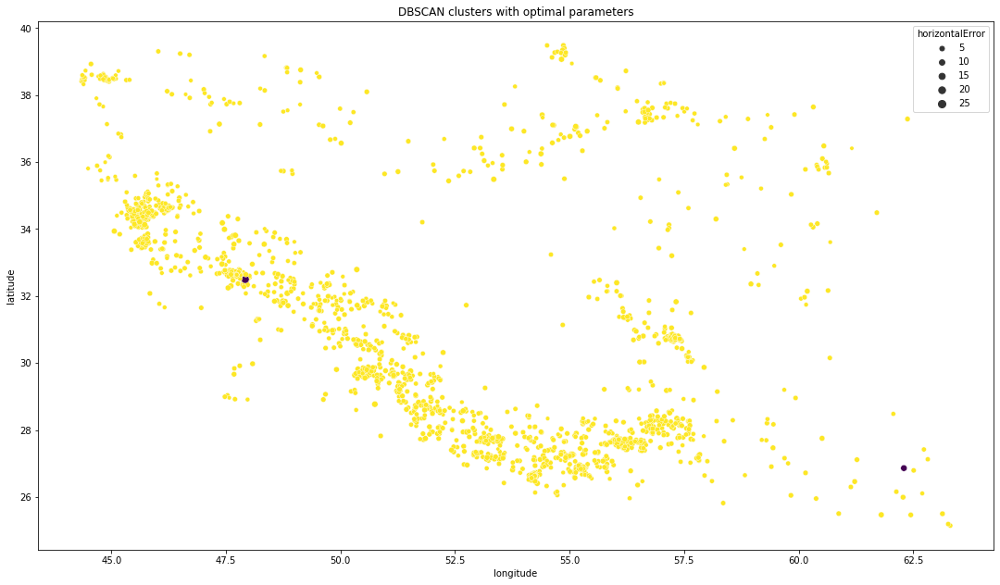

In [65]:
for feature in ['horizontalError']:
    data = earthquake_df[['longitude', 'latitude', feature]].dropna()
    db = DBSCAN(eps=2.7, min_samples=4).fit(data)
    labels = db.labels_

    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    print(f"Silhouette Coefficient: {silhouette_score(data, labels):.3f}")
    
    fig, ax = plt.subplots()

    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)

    sns.scatterplot(data=earthquake_df, x='longitude', y='latitude', size=feature, c=labels, s=50, cmap='viridis', ax=ax)
    ax.set_title('DBSCAN clusters with optimal parameters')
    plt.show()

Another example

In [66]:
eps_range = np.arange(0.1, 3, 0.1)
min_samples_range = np.arange(1, 20, 1)

data = earthquake_df[['longitude', 'latitude', 'depthError']].dropna()

results = []
for eps in eps_range:
    for min_samples in min_samples_range:
        db = DBSCAN(eps=eps, min_samples=min_samples).fit(data)
        labels = db.labels_
        results.append([eps, min_samples, silhouette_score(data, labels)])
    
results.sort(key=lambda x: x[2], reverse=True)

data = pd.DataFrame(results, columns=['eps', 'min_samples', 'silhouette_score'])
data

,eps,min_samples,silhouette_score
0,2.8,3,0.572744
1,2.9,3,0.572744
2,2.9,4,0.572744
3,2.5,3,0.565128
4,2.6,3,0.565128
...,...,...,...
546,0.1,9,-0.504186
547,0.1,10,-0.510860
548,0.1,11,-0.519959
549,0.1,12,-0.526944


Estimated number of clusters: 1
Estimated number of noise points: 10
Silhouette Coefficient: 0.573


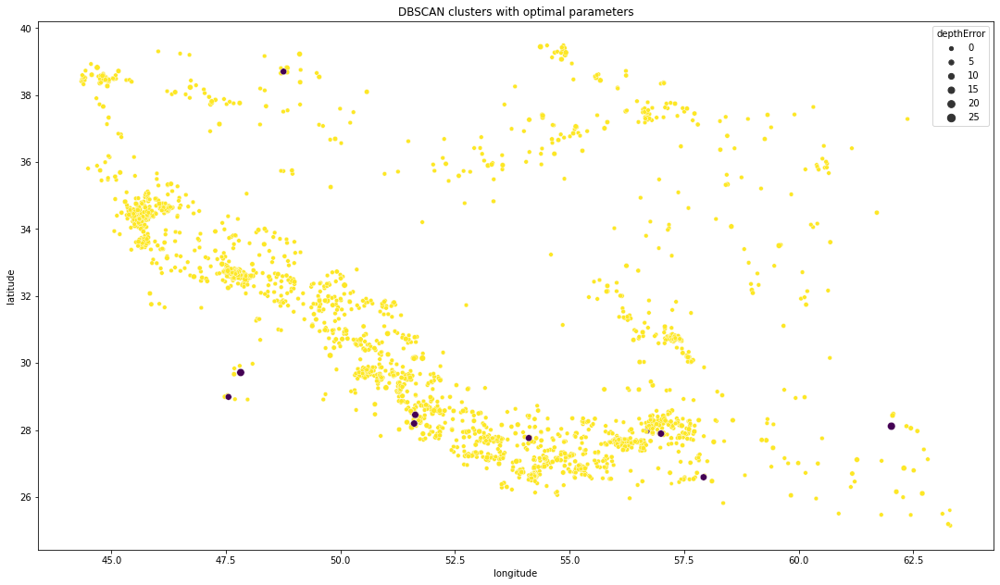

In [67]:
for feature in ['depthError']:
    data = earthquake_df[['longitude', 'latitude', feature]].dropna()
    db = DBSCAN(eps=2.8, min_samples=3).fit(data)
    labels = db.labels_

    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print("Estimated number of clusters: %d" % n_clusters_)
    print("Estimated number of noise points: %d" % n_noise_)
    print(f"Silhouette Coefficient: {silhouette_score(data, labels):.3f}")
    
    fig, ax = plt.subplots()

    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5)

    sns.scatterplot(data=earthquake_df, x='longitude', y='latitude', size=feature, c=labels, s=50, cmap='viridis', ax=ax)
    ax.set_title('DBSCAN clusters with optimal parameters')
    plt.show()